## ** Predicting Missing Cell-Type Number from Bulks using Non-Negative Least Squares Regression Residual**

*This file includes EXP1 analysis and results. Files used were created in preprocessing/EXP1_pseudos notebook.*

**Summary:**
Increasing the number of missing celltypes, using random proportions pseudobulks. Then attempting to extract missing cell type information from residual. 

For the initial study, we used a single-nucleus RNA-seq dataset with 14 cell-types derived from adipose, and extracted the expression of five immune cell types (macrophage, T cell, B cell, monocyte, dendritic cell) with distinct expression. Pseudobulks were created for deconvolution by generating a random proportion vector, and defining the total number of cells per bulk as 5000. Cells were then sampled according to the random proportion vector for each cell type. The single-cell reference for deconvolution was constructed by normalizing the number of cell types to 10,000 for each type, sampled with replacement, resulting in a signature expression per cell type, per gene. We used this reference as having 0 missing cell types, and subsequently iteratively depleted the reference of 1, 2, 3, and 4 randomly chosen cell types to end with 5 distinct single-cell reference matrices: one with 0, 1, 2, 3, and 4 missing cell types compared to the pseudobulk.

**Hypothesis:**
We can detect the number or presence of missing cell types from the rewsidual.

**Methods:**
SVD, KNN, UMAP, PCA, Neural Network, XGBoost, RandomForest

In [1]:
# import the dependencies
import sys
sys.path.insert(1, '../../')
sys.path.insert(1, '../')
sys.path.insert(1, '../../../../../')

from functions import sn_sc_preprocess
from functions import validation_processing as vp
from importlib import reload
reload(sn_sc_preprocess)
reload(vp)
# general imports
import warnings
import numpy as np
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.preprocessing import MinMaxScaler
from sklearn.decomposition import NMF
from numpy import random
from numpy import array
from numpy import diag
from numpy import dot
from numpy import zeros
import pandas as pd
from xgboost import XGBClassifier
from sklearn.metrics import classification_report, confusion_matrix
from sklearn.model_selection import train_test_split, cross_val_score
import scanpy as sc
from anndata import AnnData as ad
from tabulate import tabulate

import sklearn as sk
from sklearn.preprocessing import FunctionTransformer
from torch.utils.data import DataLoader, TensorDataset
import torch
import torch.nn as nn
import torch.optim as optim
from sklearn.metrics import classification_report, confusion_matrix
from sklearn.neighbors import KNeighborsClassifier
from sklearn.metrics import classification_report, confusion_matrix
from sklearn.preprocessing import StandardScaler
import scipy as sp
from scipy.stats import spearmanr, pearsonr
from scipy.sparse import coo_matrix
from scipy.sparse import csr_matrix
import scipy.stats as stats
from kneed import KneeLocator
from collections import Counter
import scipy as sp
from scipy.optimize import nnls
from scipy.stats import ttest_ind
# Images, plots, display, and visualization
import matplotlib.pyplot as plt
from matplotlib.cm import get_cmap
import seaborn as sns
from openTSNE import TSNE
from openTSNE import TSNEEmbedding
from openTSNE import affinity
from openTSNE import initialization
#sklearns
from sklearn.decomposition import FastICA
from sklearn.decomposition import NMF
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import accuracy_score
#from sklearn.manifold import TSNE
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import train_test_split, cross_val_score
from sklearn.metrics import classification_report, confusion_matrix
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import scale
from sklearn.cluster import KMeans
from sklearn.decomposition import PCA
from sklearn.metrics import adjusted_rand_score
from xgboost import XGBClassifier
from sklearn.metrics import classification_report, confusion_matrix
from sklearn.model_selection import train_test_split, cross_val_score
from sklearn.utils import shuffle
from sklearn import linear_model
from sklearn.metrics import mean_squared_error, r2_score
from sklearn.preprocessing import StandardScaler
from sklearn.preprocessing import MinMaxScaler

# programming stuff
import umap
import matplotlib.pyplot as plt
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score
import seaborn as sns
import time
import os, sys
import pickle
from pathlib import Path

These parameters are set in EXP1.py file.

In [2]:
#####################
### Set the study ###
#####################
# Paths:
res_name = f"MCT_snadp_EXP1"
pseudo_name = "MCT_snadp_EXP1_5CTnonoise"
files_path = "/../data/EXP1/"
cibersort_files = "/../data/EXP1/cibersort_results/snadp/MCT_snadp_EXP1_0_cibersort_sig.tsv"
noise_type = "5CTnonoise"
###### Set your random seed, num missing cells, and num_samples for reference and reproducibility
random_seed = 88
bulkprop_type = "random"
num_missing_cells = [0, 1, 2, 3]
num_bulks_total = 1000
num_samples = 10000

# How to handle negative residual distribution for NMF
nmf_cut = "minimum_value"
#Environment
kernel_name = "env_ml"

In [3]:
#parameters into paths
actual_path = os.getcwd()
path = f"{actual_path}{files_path}"
aug_data_path = f"{actual_path}{files_path}"
cibersort_path = f"{actual_path}{cibersort_files}"
#Font name for plots
font = {'fontname':'Arial'}

In [4]:
# Here we choose cells not missing in "test" set to train NN and classification models.
cells_to_miss_random = False

cells_to_miss_train_1 = {0: [], 1: [0], 2: [0, 3], 3: [1, 3, 4]}
cells_to_miss_train_2 = {0: [], 1: [2], 2: [1, 4], 3: [2, 3, 4]}
cells_to_miss_train_3 = {0: [], 1: [2], 2: [4, 3], 3: [1, 3, 2]}
cells_to_miss_train_4 = {0: [], 1: [3], 2: [0, 1], 3: [0, 2, 4]}
cells_to_miss_train_5 = {0: [], 1: [4], 2: [2, 4], 3: [0, 4, 1]}

cells_to_miss_test = {0: [], 1: [1], 2: [2, 4], 3: [0, 3, 1]}

# Import the previously processed datasets

*See preprocessing/EXP1_pseudos.ipynb notebook for details.*

In [5]:
#single cell as anndata object
adata_path = os.path.join(path, f"{res_name}_adata_notlog.h5ad")
adata_path = Path(adata_path)
sn_adata = sc.read_h5ad(adata_path)
Counter(sn_adata.obs["cell_types"])

Counter({'Preadipocyte': 26941,
         'Mesothelial cell': 26276,
         'Fat cell': 24825,
         'Macrophage': 13625,
         'Endothelial cell': 11480,
         'T cell': 3022,
         'Smooth muscle cell': 2457,
         'Endothelial cell of lymphatic vessel': 2339,
         'Pericyte cell': 1165,
         'Immature nk t cell': 1073,
         'Mast cell': 883,
         'Monocyte': 709,
         'Dendritic cell': 679,
         'Stromal cell of endometrium': 284,
         'B cell': 231,
         'Neutrophil': 77})

In [6]:
#excluding all cell types except 5 of interest
#if pseudos have 5 cell types
if pseudo_name == "MCT_snadp_EXP1_5CTnoise" or pseudo_name == "MCT_snadp_EXP1_5CTnonoise": 
    exclude = ['Preadipocyte',
        'Mesothelial cell',
        'Pericyte cell',
        'Fat cell',
        'Endothelial cell',
        'Endothelial cell of lymphatic vessel',
        'Smooth muscle cell',
        'Mast cell',
        'Immature nk t cell',
        'Stromal cell of endometrium',
        'Neutrophil']
    sn_adata = sn_adata[~sn_adata.obs["cell_types"].isin(exclude), :]
# ~ is “not”, so this reads like “var names that are not in exclude”
print(Counter(sn_adata.obs["cell_types"]))
# define the number of cells and the list of missing cell counts
num_cells = len(sn_adata.obs.cell_types.unique())
cell_order = sn_adata.obs.cell_types.unique()

Counter({'Macrophage': 13625, 'T cell': 3022, 'Monocyte': 709, 'Dendritic cell': 679, 'B cell': 231})


## Creating Cell Reference and Importing Bulks:


ref_raw is the sum of each gene expression per num_samples of each cell type. This is not scaled (raw). \
Once it is clipped and scaled with MinMax(), it becomes: ref_df, which is used in NNLS. 

In [7]:
# Making cell type reference without scaling
cell_types = sn_adata.obs["cell_types"].unique()
gene_ids = sn_adata.var_names
ref_raw = pd.DataFrame(index = gene_ids, columns = cell_types)
for cell_type in cell_types:
    cell_df = sn_adata[sn_adata.obs["cell_types"].isin([cell_type])]
    cell_sample = sk.utils.resample(cell_df, n_samples = num_samples, replace=True)
    x = cell_sample.X.sum(axis=0)
    sum_over_genes = pd.DataFrame(x).T
    #and save to df dict
    ref_raw[cell_type] = sum_over_genes.values
ref_raw = ref_raw.sort_index(axis=1) 
ref_raw

,B cell,Dendritic cell,Macrophage,Monocyte,T cell
A1BG,61.0,192.0,112.0,121.0,141.0
A1BG-AS1,339.0,669.0,381.0,376.0,336.0
A1CF,0.0,26.0,14.0,0.0,15.0
A2M,2340.0,8362.0,10367.0,2072.0,11892.0
A2M-AS1,270.0,119.0,129.0,79.0,1426.0
...,...,...,...,...,...
AL049555.1,0.0,0.0,1.0,0.0,0.0
AL109945.1,0.0,0.0,0.0,0.0,0.0
HIST1H3G,0.0,29.0,0.0,24.0,0.0
PAEP,0.0,0.0,5.0,0.0,0.0


In [8]:
#clippign before scaling to 95th pecentile
ref_raw_val = ref_raw.values
clip_upper = np.quantile(ref_raw_val, 0.95)
ref_raw_val = np.clip(ref_raw_val, 0, clip_upper)
#and scaling to be between values 0 and 1 to use for NNLS
scaler = MinMaxScaler()
scaler.fit(ref_raw_val)
ref_df = scaler.transform(ref_raw_val)
ref_df = pd.DataFrame(ref_df, index = gene_ids, columns = cell_types.sort_values())
ref_raw = pd.DataFrame(ref_raw_val, index = gene_ids, columns = cell_types.sort_values())
ref_raw

,B cell,Dendritic cell,Macrophage,Monocyte,T cell
A1BG,61.0,192.000000,112.000000,121.0,141.000000
A1BG-AS1,339.0,669.000000,381.000000,376.0,336.000000
A1CF,0.0,26.000000,14.000000,0.0,15.000000
A2M,2340.0,4470.549805,4470.549805,2072.0,4470.549805
A2M-AS1,270.0,119.000000,129.000000,79.0,1426.000000
...,...,...,...,...,...
AL049555.1,0.0,0.000000,1.000000,0.0,0.000000
AL109945.1,0.0,0.000000,0.000000,0.0,0.000000
HIST1H3G,0.0,29.000000,0.000000,24.0,0.000000
PAEP,0.0,0.000000,5.000000,0.0,0.000000


Importing Bulks:

In [9]:
#each pseudo file has:
## realisitc*200, cell_type_specific*1000*, random*200, equal*200
#so here we're defining the ranges to extract the bulks of choice.
bulk_range = dict()
bulk_range["realistic"] = range(0,200)
bulk_range["cell_type_specific"] = range(200,(50*num_cells)+200) #1000
bulk_range["random"] = range((50*num_cells)+200,(50*num_cells)+400) #1200
bulk_range["equal"] = range((50*num_cells)+400,(50*num_cells)+600) #1400
bulk_range["all"] = range(0,(50*num_cells)+600)

In [10]:
num_cell_type_specific = 50 * int(sn_adata.obs["cell_types"].unique().shape[0])
num_bulks = 200+num_cell_type_specific+200+200
num_bulks

850

In [11]:
#importing bulks to deconvolve
X_full, Y_full, gene_df, meta_df = sn_sc_preprocess.read_all_pseudobulk_files(data_path=aug_data_path, noise_type= f"{noise_type}_", file_name = res_name, num_bulks_training = num_bulks, num_files=10, random_selection=True)
X_full.index = meta_df.index
Y_full.index = meta_df.index

0
1
2
3
4
5
6
7
8
9


(8000, 2)
(8000, 2)


/var/folders/d3/x10lxf7x1n37__s3n36qxmlw0000gp/T/ipykernel_40564/3012776603.py:18: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()


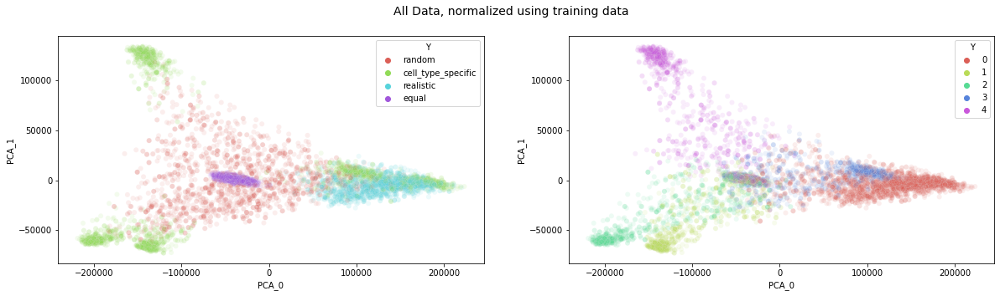

In [12]:
## plot samples (some of them for speed)
X_temp = X_full.iloc[0:8000]
Y_temp_p = Y_full.iloc[0:8000]
meta_temp = meta_df.iloc[0:8000]

plot_df = vp.get_pca_for_plotting(X_temp)

fig, axs = plt.subplots(1, 2, figsize=(20,5))

Y_temp = np.copy(Y_temp_p)
Y_temp = np.argmax(Y_temp, axis=1) 

vp.plot_pca(plot_df, meta_temp.cell_prop_type.to_numpy(), axs[0], title=f"")
vp.plot_pca(plot_df, Y_temp, axs[1], title=f"")

fig.suptitle("All Data, normalized using training data", fontsize=14)

fig.show()

In [13]:
#cut to only the type of sample specific above.
idx_interest = np.where(meta_df.cell_prop_type == bulkprop_type)[0]
pseudo_df = X_full.iloc[idx_interest]
prop_df = Y_full.iloc[idx_interest]
prop_df.columns = vp.capitalize_first_letters(prop_df.columns)
prop_df = prop_df.sort_index(axis=1)
pseudo_df.index = range(0,len(pseudo_df))
prop_df.index = pseudo_df.index
pseudo_df

gene_ids,A1BG,A1BG-AS1,A1CF,A2M,A2M-AS1,A2ML1,A2ML1-AS1,A3GALT2,A4GALT,A4GNT,...,AP003550.1,AC005544.2,AC025674.2,AC105924.1,AC239803.3,AL049555.1,AL109945.1,HIST1H3G,PAEP,PLA2G1B
0,98.0,233.0,11.0,4417.0,160.0,43.0,255.0,11.0,40.0,0.0,...,0.0,0.0,0.0,1.0,0.0,0.0,0.0,5.0,1.0,0.0
1,68.0,187.0,3.0,3022.0,186.0,47.0,163.0,8.0,43.0,0.0,...,1.0,0.0,0.0,2.0,3.0,0.0,0.0,5.0,0.0,0.0
2,59.0,217.0,6.0,4154.0,135.0,36.0,245.0,11.0,37.0,1.0,...,1.0,0.0,0.0,2.0,2.0,0.0,0.0,8.0,0.0,0.0
3,56.0,211.0,1.0,2310.0,99.0,31.0,160.0,11.0,60.0,0.0,...,0.0,0.0,0.0,1.0,3.0,0.0,0.0,4.0,0.0,0.0
4,86.0,249.0,9.0,3785.0,124.0,41.0,224.0,18.0,45.0,1.0,...,2.0,0.0,0.0,1.0,2.0,0.0,0.0,9.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1983,76.0,235.0,7.0,4249.0,183.0,37.0,232.0,15.0,42.0,0.0,...,0.0,0.0,0.0,4.0,0.0,0.0,0.0,5.0,1.0,0.0
1984,71.0,204.0,11.0,3884.0,321.0,42.0,168.0,4.0,44.0,0.0,...,2.0,0.0,0.0,2.0,3.0,1.0,0.0,4.0,0.0,0.0
1985,74.0,211.0,1.0,4234.0,92.0,58.0,284.0,16.0,33.0,3.0,...,0.0,0.0,0.0,1.0,2.0,1.0,0.0,3.0,0.0,0.0
1986,75.0,212.0,8.0,3882.0,231.0,39.0,169.0,9.0,43.0,2.0,...,2.0,0.0,0.0,1.0,0.0,0.0,0.0,11.0,0.0,0.0


In [14]:
# read in cibersort barcode genes 
cibersort_df = pd.read_csv(cibersort_path, sep="\t")
cibersort_genes = cibersort_df["NAME"].values.tolist()
#and set intersection of gene_ids and cibersort:
gene_notin = np.setdiff1d(gene_ids, cibersort_genes)
#keep genes in both and check number
gene_ids = [ele for ele in gene_ids if ele not in gene_notin]
len(gene_ids)     

997

In [15]:
#cutting to cibersort barcode genes 
pseudo_df = pseudo_df[gene_ids]
pseudo_copy = pseudo_df.copy()
ref_raw = ref_raw.loc[gene_ids,:]
ref_df = ref_df.loc[gene_ids,:]

In [16]:
#clippign before scaling to 95th pecentile
pseudo_df = pseudo_df.values #np array
clip_upper = np.quantile(pseudo_df, 0.95)
pseudo_df = np.clip(pseudo_df, 0, clip_upper)
#and normalize to values between 0 and 1
scaler = MinMaxScaler()
scaler.fit(pseudo_df)
normalized_pseudo_df = scaler.transform(pseudo_df)
normalized_pseudo_df = pd.DataFrame(normalized_pseudo_df, 
                            columns = pseudo_copy.columns, index= pseudo_copy.index)
normalized_pseudo_df      

gene_ids,A2M,AAMDC,AATBC,ABCA10,ABCA5,ABCA6,ABCA8,ABCA9,ABCB10,ABCB4,...,GORASP2,GPALPP1,GPAT3,GPAT4,GPATCH11,GPC6,GPI,GPM6A,GPR132,GPR137B
0,1.000000,0.708185,0.139726,0.260131,0.250507,1.0,0.767947,1.000000,0.504440,0.200734,...,0.389892,0.724566,0.653559,0.676606,0.492718,0.272287,0.772436,0.046740,0.773109,0.943028
1,1.000000,0.265125,0.539726,0.291503,0.260649,1.0,0.272120,0.590810,0.600355,0.145655,...,0.501805,0.454094,0.305938,0.591743,0.186893,0.217054,0.717949,0.148075,0.474790,0.435782
2,1.000000,0.738434,0.216438,0.284967,0.316430,1.0,0.711185,1.000000,0.602131,0.272950,...,0.202166,0.667494,0.425482,0.575688,0.507282,0.226744,0.580128,0.194815,0.684874,0.842079
3,0.726839,0.362989,0.324658,0.516340,0.446247,1.0,0.288815,0.518053,0.362345,0.526316,...,0.581227,0.270471,0.317735,0.511468,0.415049,0.514535,0.621795,0.602121,0.424370,0.366317
4,1.000000,0.620996,0.202740,0.316340,0.370183,1.0,0.477462,1.000000,0.474245,0.292534,...,0.342960,0.744417,0.567047,0.603211,0.563107,0.218992,0.785256,0.285939,0.567227,0.795602
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1983,1.000000,0.603203,0.272603,0.205229,0.297160,1.0,0.515860,1.000000,0.571936,0.170135,...,0.436823,0.575682,0.640582,0.692661,0.558252,0.171512,0.580128,0.032600,0.741597,0.771614
1984,1.000000,0.370107,0.317808,0.328105,0.464503,1.0,0.343907,0.378556,0.525755,0.089351,...,0.364621,0.456576,0.477782,0.428899,0.342233,0.214147,0.435897,0.036135,0.357143,0.292354
1985,1.000000,0.774021,0.269863,0.094118,0.143002,1.0,0.781302,1.000000,0.586146,0.146879,...,0.628159,0.784119,0.196225,0.589450,0.344660,0.062984,0.733974,0.122545,0.674370,1.000000
1986,1.000000,0.613879,0.230137,0.338562,0.478702,1.0,0.442404,0.762035,0.344583,0.345165,...,0.335740,0.550868,0.482894,0.566514,0.582524,0.331395,0.628205,0.260016,0.399160,0.508246


In [17]:
# Divide bulks for testing and training:
percent_training = 0.8
number_training = int(percent_training * pseudo_copy.shape[0])
print(number_training)
idx_train = np.random.choice(pseudo_copy.index, size=number_training, replace=False)
training_bulks = normalized_pseudo_df.loc[idx_train]
testing_bulks = normalized_pseudo_df.drop(idx_train).copy()
training_props = prop_df.loc[idx_train]
testing_props = prop_df.drop(idx_train).copy()

1590


TSNEs of Pseuboulks and References: We expect the point of the References (cells) to be in separated within the pseudobulks encoding.

===> Finding 180 nearest neighbors using Annoy approximate search using euclidean distance...
   --> Time elapsed: 0.53 seconds
===> Calculating affinity matrix...
   --> Time elapsed: 0.02 seconds
===> Running optimization with exaggeration=1.00, lr=1988.00 for 500 iterations...
Iteration   50, KL divergence 0.8895, 50 iterations in 0.3951 sec
Iteration  100, KL divergence 0.8277, 50 iterations in 0.5824 sec
Iteration  150, KL divergence 0.8112, 50 iterations in 0.7728 sec
Iteration  200, KL divergence 0.7981, 50 iterations in 1.0907 sec
Iteration  250, KL divergence 0.7926, 50 iterations in 1.2164 sec
Iteration  300, KL divergence 0.7894, 50 iterations in 1.2444 sec
Iteration  350, KL divergence 0.7863, 50 iterations in 1.2585 sec
Iteration  400, KL divergence 0.7842, 50 iterations in 1.3802 sec
Iteration  450, KL divergence 0.7821, 50 iterations in 1.5270 sec
Iteration  500, KL divergence 0.7778, 50 iterations in 1.4329 sec
   --> Time elapsed: 10.90 seconds
===> Finding 15 nearest 

Perplexity value 60 is too high. Using perplexity 1.33 instead


Iteration  250, KL divergence 18491.7800, 50 iterations in 0.0336 sec
   --> Time elapsed: 0.17 seconds
===> Finding 15 nearest neighbors in existing embedding using Annoy approximate search...
   --> Time elapsed: 0.00 seconds
===> Calculating affinity matrix...
   --> Time elapsed: 0.00 seconds
===> Running optimization with exaggeration=4.00, lr=0.10 for 0 iterations...
   --> Time elapsed: 0.00 seconds
===> Running optimization with exaggeration=1.50, lr=0.10 for 250 iterations...
Iteration   50, KL divergence 17.9273, 50 iterations in 0.0089 sec
Iteration  100, KL divergence 17.6955, 50 iterations in 0.0074 sec
Iteration  150, KL divergence 17.5170, 50 iterations in 0.0069 sec
Iteration  200, KL divergence 17.5104, 50 iterations in 0.0068 sec
Iteration  250, KL divergence 17.5102, 50 iterations in 0.0067 sec
   --> Time elapsed: 0.04 seconds
===> Finding 4 nearest neighbors using exact search using euclidean distance...
   --> Time elapsed: 0.00 seconds
===> Calculating affinity m

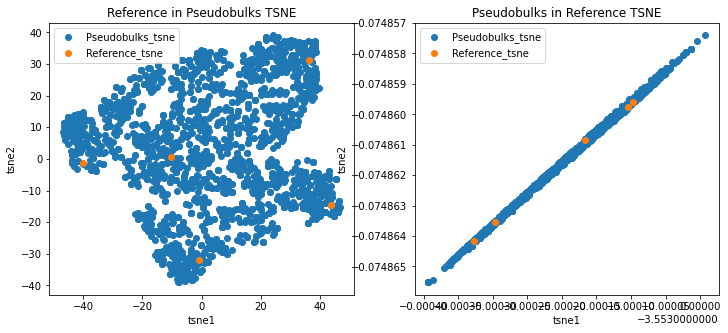

In [18]:
#tsne plots of reference dataframes projected in normalized pseudobulks TSNE 
#figures
plt.figure(figsize=(12, 5))
#data used
x_train = normalized_pseudo_df.values
x_test = ref_df.T.values
#compute the affinities between data points
affinities_train = affinity.PerplexityBasedNN(
    x_train,
    perplexity=60,
    metric="euclidean",
    n_jobs=8,
    random_state=42,
    verbose=True,
)
#initialize coordinates for embedd.
init_train = initialization.pca(x_train, random_state=42)
embedding_train = TSNEEmbedding(
    init_train,
    affinities_train,
    negative_gradient_method="fft",
    n_jobs=8,
    verbose=True,
)
#optimize embedding
embedding_train = embedding_train.optimize(n_iter=500)
#transform both in train embedd.
tsne_train = embedding_train.transform(x_train)
tsne_test = embedding_train.transform(x_test)
plt.subplot(1, 2, 1)
plt.scatter(tsne_train[:,0], tsne_train[:,1], label = "Pseudobulks_tsne" )
plt.scatter(tsne_test[:,0], tsne_test[:,1], label = "Reference_tsne" )
plt.title(f"Reference in Pseudobulks TSNE")
plt.xlabel("tsne1")
plt.ylabel("tsne2")
plt.legend()
#data used (switching)
x_train = ref_df.T.values
x_test = normalized_pseudo_df.values
#compute the affinities between data points
affinities_train = affinity.PerplexityBasedNN(
    x_train,
    perplexity=60,
    metric="euclidean",
    n_jobs=8,
    random_state=42,
    verbose=True,
)
#initialize coordinates for embedd.
init_train = initialization.pca(x_train, random_state=42)
embedding_train = TSNEEmbedding(
    init_train,
    affinities_train,
    negative_gradient_method="fft",
    n_jobs=8,
    verbose=True,
)
#optimize embedding
embedding_train = embedding_train.optimize(n_iter=500)
#transform both in train embedd.
tsne_train = embedding_train.transform(x_train)
tsne_test = embedding_train.transform(x_test)
plt.subplot(1, 2, 2)
plt.scatter(tsne_test[:,0], tsne_test[:,1], label = "Pseudobulks_tsne" )
plt.scatter(tsne_train[:,0], tsne_train[:,1], label = "Reference_tsne" )
plt.title(f"Pseudobulks in Reference TSNE")
plt.xlabel("tsne1")
plt.ylabel("tsne2")
plt.legend()
plt.show()

#Each cell in the reference should be far apart.

In [19]:
all_refs_train_1 = dict()
all_prop_refs_train_1 = dict()
all_prop_refs_rebalanced_train_1 = dict()
all_refs_raw_train_1 = dict()
all_refs_av_train_1 = dict()
#with no cell missing is just ref_df
all_refs_train_1[0] = ref_df.copy()
all_refs_raw_train_1[0] = ref_raw.copy()
all_prop_refs_train_1[0] = training_props.copy()
all_prop_refs_rebalanced_train_1[0] = training_props.copy()

#Assigning the rest in a loop
for num in num_missing_cells[1:]:
    #dropping cell types missing from references
    all_refs_train_1[num] = ref_df.drop(ref_df.columns[cells_to_miss_train_1[num]], axis=1)
    all_refs_raw_train_1[num] = ref_raw.drop(ref_raw.columns[cells_to_miss_train_1[num]], axis=1)
    all_prop_refs_train_1[num] = training_props.drop(training_props.columns[cells_to_miss_train_1[num]], axis=1) 
    all_prop_refs_train_1[num]= all_prop_refs_train_1[num].sort_index(axis=1)
    all_prop_refs_rebalanced_train_1[num] = all_prop_refs_train_1[num]
    all_prop_refs_rebalanced_train_1[num] = all_prop_refs_rebalanced_train_1[num].sort_index(axis=1)
    for idx,sample in all_prop_refs_rebalanced_train_1[num].iterrows():
        tot = np.sum(sample) #making them equal 1
        sample = sample / tot

In [20]:
all_refs_train_2 = dict()
all_prop_refs_train_2 = dict()
all_prop_refs_rebalanced_train_2 = dict()
all_refs_raw_train_2 = dict()
all_refs_av_train_2 = dict()
#with no cell missing is just ref_df
all_refs_train_2[0] = ref_df.copy()
all_refs_raw_train_2[0] = ref_raw.copy()
all_prop_refs_train_2[0] = training_props.copy()
all_prop_refs_rebalanced_train_2[0] = training_props.copy()

#Assigning the rest in a loop
for num in num_missing_cells[1:]:
    #dropping cell types missing from references
    all_refs_train_2[num] = ref_df.drop(ref_df.columns[cells_to_miss_train_2[num]], axis=1)
    all_refs_raw_train_2[num] = ref_raw.drop(ref_raw.columns[cells_to_miss_train_2[num]], axis=1)
    all_prop_refs_train_2[num] = training_props.drop(training_props.columns[cells_to_miss_train_2[num]], axis=1) 
    all_prop_refs_train_2[num]= all_prop_refs_train_2[num].sort_index(axis=1)
    all_prop_refs_rebalanced_train_2[num] = all_prop_refs_train_2[num]
    all_prop_refs_rebalanced_train_2[num] = all_prop_refs_rebalanced_train_2[num].sort_index(axis=1)
    for idx,sample in all_prop_refs_rebalanced_train_2[num].iterrows():
        tot = np.sum(sample) #making them equal 1
        sample = sample / tot

In [21]:
all_refs_train_3 = dict()
all_prop_refs_train_3 = dict()
all_prop_refs_rebalanced_train_3 = dict()
all_refs_raw_train_3 = dict()
all_refs_av_train_3 = dict()
#with no cell missing is just ref_df
all_refs_train_3[0] = ref_df.copy()
all_refs_raw_train_3[0] = ref_raw.copy()
all_prop_refs_train_3[0] = training_props.copy()
all_prop_refs_rebalanced_train_3[0] = training_props.copy()

#Assigning the rest in a loop
for num in num_missing_cells[1:]:
    #dropping cell types missing from references
    all_refs_train_3[num] = ref_df.drop(ref_df.columns[cells_to_miss_train_3[num]], axis=1)
    all_refs_raw_train_3[num] = ref_raw.drop(ref_raw.columns[cells_to_miss_train_3[num]], axis=1)
    all_prop_refs_train_3[num] = training_props.drop(training_props.columns[cells_to_miss_train_3[num]], axis=1) 
    all_prop_refs_train_3[num]= all_prop_refs_train_3[num].sort_index(axis=1)
    all_prop_refs_rebalanced_train_3[num] = all_prop_refs_train_3[num]
    all_prop_refs_rebalanced_train_3[num] = all_prop_refs_rebalanced_train_3[num].sort_index(axis=1)
    for idx,sample in all_prop_refs_rebalanced_train_3[num].iterrows():
        tot = np.sum(sample) #making them equal 1
        sample = sample / tot

In [22]:
all_refs_train_4 = dict()
all_prop_refs_train_4 = dict()
all_prop_refs_rebalanced_train_4 = dict()
all_refs_raw_train_4 = dict()
all_refs_av_train_4 = dict()
#with no cell missing is just ref_df
all_refs_train_4[0] = ref_df.copy()
all_refs_raw_train_4[0] = ref_raw.copy()
all_prop_refs_train_4[0] = training_props.copy()
all_prop_refs_rebalanced_train_4[0] = training_props.copy()

#Assigning the rest in a loop
for num in num_missing_cells[1:]:
    #dropping cell types missing from references
    all_refs_train_4[num] = ref_df.drop(ref_df.columns[cells_to_miss_train_4[num]], axis=1)
    all_refs_raw_train_4[num] = ref_raw.drop(ref_raw.columns[cells_to_miss_train_4[num]], axis=1)
    all_prop_refs_train_4[num] = training_props.drop(training_props.columns[cells_to_miss_train_4[num]], axis=1) 
    all_prop_refs_train_4[num]= all_prop_refs_train_4[num].sort_index(axis=1)
    all_prop_refs_rebalanced_train_4[num] = all_prop_refs_train_4[num]
    all_prop_refs_rebalanced_train_4[num] = all_prop_refs_rebalanced_train_4[num].sort_index(axis=1)
    for idx,sample in all_prop_refs_rebalanced_train_4[num].iterrows():
        tot = np.sum(sample) #making them equal 1
        sample = sample / tot

In [23]:
all_refs_train_5 = dict()
all_prop_refs_train_5 = dict()
all_prop_refs_rebalanced_train_5 = dict()
all_refs_raw_train_5 = dict()
all_refs_av_train_5 = dict()
#with no cell missing is just ref_df
all_refs_train_5[0] = ref_df.copy()
all_refs_raw_train_5[0] = ref_raw.copy()
all_prop_refs_train_5[0] = training_props.copy()
all_prop_refs_rebalanced_train_5[0] = training_props.copy()

#Assigning the rest in a loop
for num in num_missing_cells[1:]:
    #dropping cell types missing from references
    all_refs_train_5[num] = ref_df.drop(ref_df.columns[cells_to_miss_train_5[num]], axis=1)
    all_refs_raw_train_5[num] = ref_raw.drop(ref_raw.columns[cells_to_miss_train_5[num]], axis=1)
    all_prop_refs_train_5[num] = training_props.drop(training_props.columns[cells_to_miss_train_5[num]], axis=1) 
    all_prop_refs_train_5[num]= all_prop_refs_train_5[num].sort_index(axis=1)
    all_prop_refs_rebalanced_train_5[num] = all_prop_refs_train_5[num]
    all_prop_refs_rebalanced_train_5[num] = all_prop_refs_rebalanced_train_5[num].sort_index(axis=1)
    for idx,sample in all_prop_refs_rebalanced_train_5[num].iterrows():
        tot = np.sum(sample) #making them equal 1
        sample = sample / tot

In [24]:
all_refs_test = dict()
all_prop_refs_test = dict()
all_prop_refs_rebalanced_test = dict()
all_refs_raw_test = dict()
all_refs_av_test = dict()
#with no cell missing is just ref_df
all_refs_test[0] = ref_df.copy()
all_refs_raw_test[0] = ref_raw.copy()
all_prop_refs_test[0] = testing_props.copy()
all_prop_refs_rebalanced_test[0] = testing_props.copy()

#Assigning the rest in a loop
for num in num_missing_cells[1:]:
    #dropping cell types missing from references
    all_refs_test[num] = ref_df.drop(ref_df.columns[cells_to_miss_test[num]], axis=1)
    all_refs_raw_test[num] = ref_raw.drop(ref_raw.columns[cells_to_miss_test[num]], axis=1)
    all_prop_refs_test[num] = testing_props.drop(testing_props.columns[cells_to_miss_test[num]], axis=1) 
    all_prop_refs_test[num]= all_prop_refs_test[num].sort_index(axis=1)
    all_prop_refs_rebalanced_test[num] = all_prop_refs_test[num]
    all_prop_refs_rebalanced_test[num] = all_prop_refs_rebalanced_test[num].sort_index(axis=1)
    for idx,sample in all_prop_refs_rebalanced_test[num].iterrows():
        tot = np.sum(sample) #making them equal 1
        sample = sample / tot

## NNLS Deconvolution:

In [25]:
calc_prop_tot_train_1, calc_res_tot_train_1, custom_res_tot_train_1, comparison_prop_tot_train_1, missing_cell_tot_train_1  = vp.calc_nnls(all_refs_train_1, training_props, training_bulks, num_missing_cells, cells_to_miss_train_1)


Exp 0
Exp 1
Exp 2
Exp 3


In [26]:
calc_prop_tot_train_2, calc_res_tot_train_2, custom_res_tot_train_2, comparison_prop_tot_train_2, missing_cell_tot_train_2  = vp.calc_nnls(all_refs_train_2, training_props, training_bulks, num_missing_cells, cells_to_miss_train_2)

Exp 0
Exp 1
Exp 2
Exp 3


In [27]:
calc_prop_tot_train_3, calc_res_tot_train_3, custom_res_tot_train_3, comparison_prop_tot_train_3, missing_cell_tot_train_3  = vp.calc_nnls(all_refs_train_3, training_props, training_bulks, num_missing_cells, cells_to_miss_train_3)


Exp 0
Exp 1
Exp 2
Exp 3


In [28]:
calc_prop_tot_train_4, calc_res_tot_train_4, custom_res_tot_train_4, comparison_prop_tot_train_4, missing_cell_tot_train_4  = vp.calc_nnls(all_refs_train_4, training_props, training_bulks, num_missing_cells, cells_to_miss_train_4)


Exp 0
Exp 1
Exp 2
Exp 3


In [29]:
calc_prop_tot_train_5, calc_res_tot_train_5, custom_res_tot_train_5, comparison_prop_tot_train_5, missing_cell_tot_train_5  = vp.calc_nnls(all_refs_train_5, training_props, training_bulks, num_missing_cells, cells_to_miss_train_5)


Exp 0
Exp 1
Exp 2
Exp 3


In [30]:
calc_prop_tot_test, calc_res_tot_test, custom_res_tot_test, comparison_prop_tot_test, missing_cell_tot_test  = vp.calc_nnls(all_refs_test, testing_props, testing_bulks, num_missing_cells, cells_to_miss_test)

Exp 0
Exp 1
Exp 2
Exp 3


## Evalutating NNLS Performance:

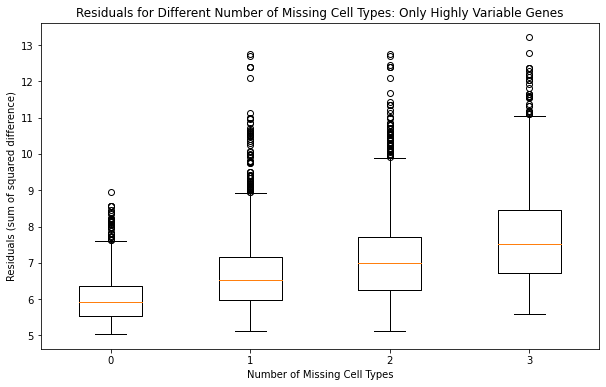

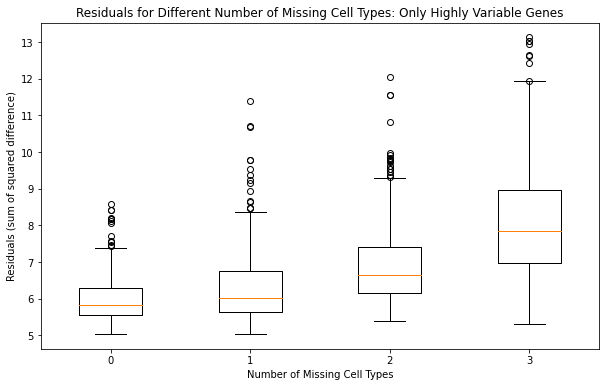

In [31]:
#Distribution of residuals as the sum of squared difference from NNLS
residuals = [calc_res_tot_train_1[exp] for exp in num_missing_cells]

plt.figure(figsize=(10, 6))
plt.boxplot(residuals, labels=num_missing_cells)
plt.xlabel('Number of Missing Cell Types')
plt.ylabel('Residuals (sum of squared difference)')
plt.title('Residuals for Different Number of Missing Cell Types: Only Highly Variable Genes')
plt.show()
#Distribution of residuals as the sum of squared difference from NNLS
residuals = [calc_res_tot_test[exp] for exp in num_missing_cells]

plt.figure(figsize=(10, 6))
plt.boxplot(residuals, labels=num_missing_cells)
plt.xlabel('Number of Missing Cell Types')
plt.ylabel('Residuals (sum of squared difference)')
plt.title('Residuals for Different Number of Missing Cell Types: Only Highly Variable Genes')
plt.show()

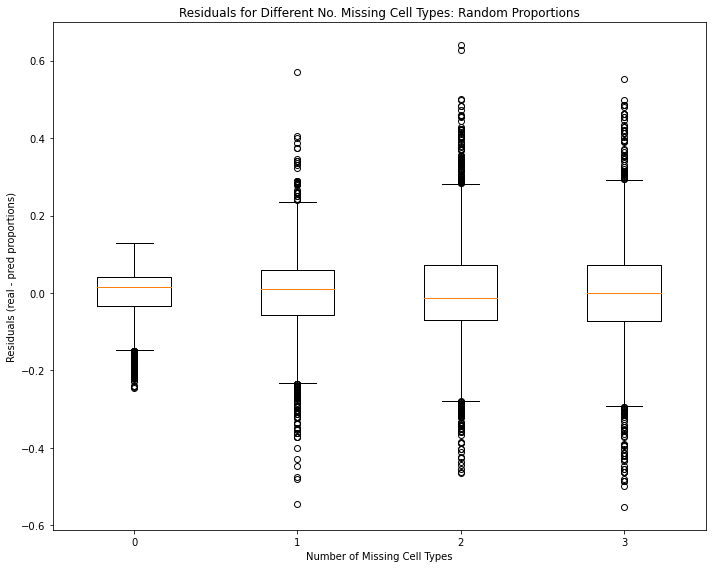

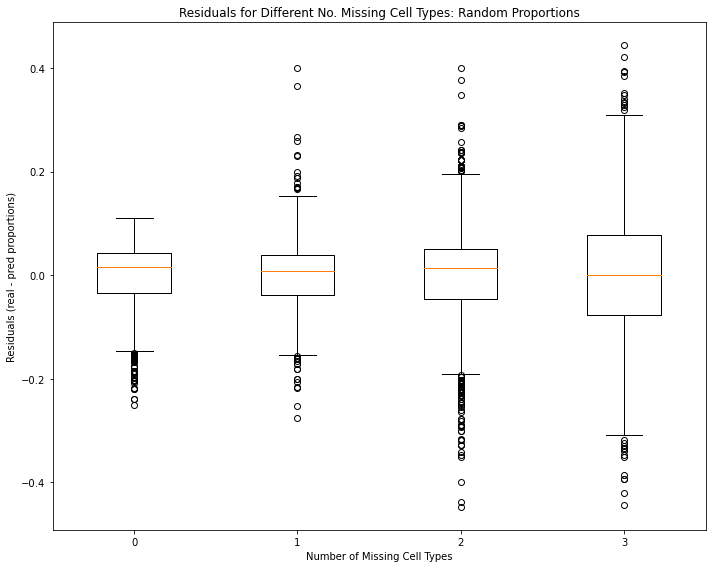

In [32]:
#Distribution of residuals as the difference between calculated and real proportions.
fig, ax = plt.subplots(figsize=(10, 8))

# List to store all the residual values
residual_values = []

# Iterate over the dataframes and extract the residual values
for num_cells in num_missing_cells:
    df = custom_res_tot_train_1[num_cells]
    residuals = df.values.flatten()  # Flatten the dataframe to a 1D array
    residual_values.append(residuals)

# Plot the box and whisker plot for all the residuals
ax.boxplot(residual_values, labels=num_missing_cells)
ax.set_title("Residuals for Different No. Missing Cell Types: Random Proportions")
ax.set_xlabel("Number of Missing Cell Types")
ax.set_ylabel("Residuals (real - pred proportions)")

plt.tight_layout()
plt.show()


#Distribution of residuals as the difference between calculated and real proportions.
fig, ax = plt.subplots(figsize=(10, 8))

# List to store all the residual values
residual_values = []

# Iterate over the dataframes and extract the residual values
for num_cells in num_missing_cells:
    df = custom_res_tot_test[num_cells]
    residuals = df.values.flatten()  # Flatten the dataframe to a 1D array
    residual_values.append(residuals)

# Plot the box and whisker plot for all the residuals
ax.boxplot(residual_values, labels=num_missing_cells)
ax.set_title("Residuals for Different No. Missing Cell Types: Random Proportions")
ax.set_xlabel("Number of Missing Cell Types")
ax.set_ylabel("Residuals (real - pred proportions)")

plt.tight_layout()
plt.show()

{'T cell', 'Monocyte', 'B cell', 'Macrophage', 'Dendritic cell'}
Index(['B cell', 'Dendritic cell', 'Macrophage', 'Monocyte', 'T cell'], dtype='object')
CategoricalIndex(['B cell', 'Dendritic cell', 'Macrophage', 'Monocyte',
                  'T cell'],
                 categories=['B cell', 'Dendritic cell', 'Macrophage', 'Monocyte', 'T cell'], ordered=False, dtype='category')
Index(['B cell', 'Dendritic cell', 'Macrophage', 'Monocyte', 'T cell'], dtype='object')
['B cell', 'Dendritic cell', 'Macrophage', 'Monocyte', 'T cell']
Real Proportions shape: (1590, 5)
Estimated Proportions shape: (1590, 5)


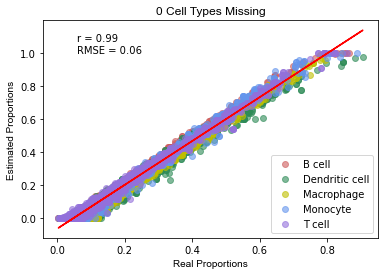

Index(['Dendritic cell', 'Macrophage', 'Monocyte', 'T cell'], dtype='object')
CategoricalIndex(['Dendritic cell', 'Macrophage', 'Monocyte', 'T cell'], categories=['B cell', 'Dendritic cell', 'Macrophage', 'Monocyte', 'T cell'], ordered=False, dtype='category')
Index(['Dendritic cell', 'Macrophage', 'Monocyte', 'T cell'], dtype='object')
['Dendritic cell', 'Macrophage', 'Monocyte', 'T cell']
Real Proportions shape: (1590, 4)
Estimated Proportions shape: (1590, 4)


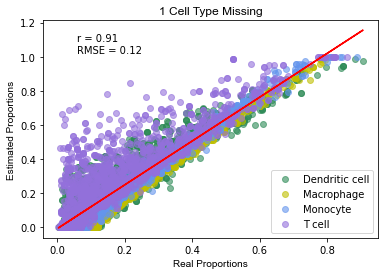

Index(['Dendritic cell', 'Macrophage', 'T cell'], dtype='object')
CategoricalIndex(['Dendritic cell', 'Macrophage', 'T cell'], categories=['B cell', 'Dendritic cell', 'Macrophage', 'Monocyte', 'T cell'], ordered=False, dtype='category')
Index(['Dendritic cell', 'Macrophage', 'T cell'], dtype='object')
['Dendritic cell', 'Macrophage', 'T cell']
Real Proportions shape: (1590, 3)
Estimated Proportions shape: (1590, 3)


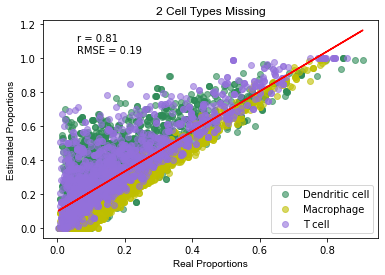

Index(['B cell', 'Macrophage'], dtype='object')
CategoricalIndex(['B cell', 'Macrophage'], categories=['B cell', 'Dendritic cell', 'Macrophage', 'Monocyte', 'T cell'], ordered=False, dtype='category')
Index(['B cell', 'Macrophage'], dtype='object')
['B cell', 'Macrophage']
Real Proportions shape: (1590, 2)
Estimated Proportions shape: (1590, 2)


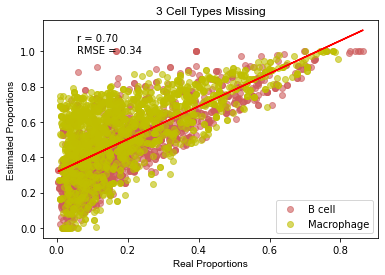

In [33]:
# Collecting all unique cell types across num_missing_cells
custom_colors = [ 'mediumpurple','cornflowerblue', 'indianred','y', 'seagreen', 'darkorange']
all_cell_types = set()
for num in num_missing_cells:
    all_cell_types.update(all_prop_refs_train_1[num].columns.tolist())

print(all_cell_types)

# Creating a fixed color mapping for all cell types
color_map = {cell_type: custom_colors[i % len(custom_colors)] for i, cell_type in enumerate(all_cell_types)}

for num in num_missing_cells:
    
    real_proportions = all_prop_refs_rebalanced_train_1[num].values.astype(float)
    estimated_proportions = calc_prop_tot_train_1[num].values.astype(float)
    cell_types = all_prop_refs_train_1[num].columns.tolist()

    print(all_prop_refs_rebalanced_train_1[num].columns)
    print(calc_prop_tot_train_1[num].columns)
    print(all_prop_refs_train_1[num].columns)
    print(cell_types)

    # Print the shapes of the matrices
    print("Real Proportions shape:", real_proportions.shape)
    print("Estimated Proportions shape:", estimated_proportions.shape)
    
    correlation_coefficient = np.corrcoef(real_proportions, estimated_proportions)[0, 1]
    
    # Scatter plot
    fig, ax = plt.subplots()
    for cell_type in cell_types:
        x = real_proportions[:, cell_types.index(cell_type)]
        y = estimated_proportions[:, cell_types.index(cell_type)]
        
        # Use the fixed color mapping
        color = color_map[cell_type]
        
        ax.scatter(x, y, label=cell_type, color=color, alpha=0.6)
    
    
    # Fit a regression line
    m, b = np.polyfit(real_proportions.flatten(), estimated_proportions.flatten(), 1)
    plt.plot(real_proportions.flatten(), m * real_proportions.flatten() + b, color="red")
    
    # Calculate r
    r, p = stats.pearsonr(real_proportions.flatten(), estimated_proportions.flatten())
    
    # Calculate RMSE
    rmse = np.sqrt(((real_proportions - estimated_proportions) ** 2).mean())
    
    # And annotate
    plt.annotate(f'r = {r:.2f}\nRMSE = {rmse:.2f}', xy=(0.1, 0.85), xycoords='axes fraction')
    
    plt.xlabel('Real Proportions', **font)
    plt.ylabel('Estimated Proportions', **font)
    if num == 1:
        plt.title(f'{num} Cell Type Missing', **font)
    else:    
        plt.title(f'{num} Cell Types Missing', **font)

    plt.legend(loc='lower right')  # show the cell type labels in the legend
    plt.show()


{'T cell', 'Monocyte', 'B cell', 'Macrophage', 'Dendritic cell'}
Index(['B cell', 'Dendritic cell', 'Macrophage', 'Monocyte', 'T cell'], dtype='object')
CategoricalIndex(['B cell', 'Dendritic cell', 'Macrophage', 'Monocyte',
                  'T cell'],
                 categories=['B cell', 'Dendritic cell', 'Macrophage', 'Monocyte', 'T cell'], ordered=False, dtype='category')
Index(['B cell', 'Dendritic cell', 'Macrophage', 'Monocyte', 'T cell'], dtype='object')
['B cell', 'Dendritic cell', 'Macrophage', 'Monocyte', 'T cell']
Real Proportions shape: (398, 5)
Estimated Proportions shape: (398, 5)


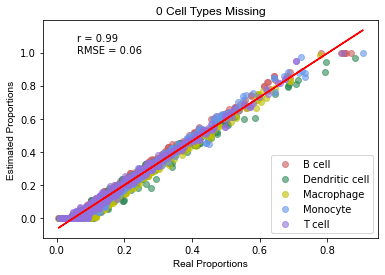

Index(['B cell', 'Macrophage', 'Monocyte', 'T cell'], dtype='object')
CategoricalIndex(['B cell', 'Macrophage', 'Monocyte', 'T cell'], categories=['B cell', 'Dendritic cell', 'Macrophage', 'Monocyte', 'T cell'], ordered=False, dtype='category')
Index(['B cell', 'Macrophage', 'Monocyte', 'T cell'], dtype='object')
['B cell', 'Macrophage', 'Monocyte', 'T cell']
Real Proportions shape: (398, 4)
Estimated Proportions shape: (398, 4)


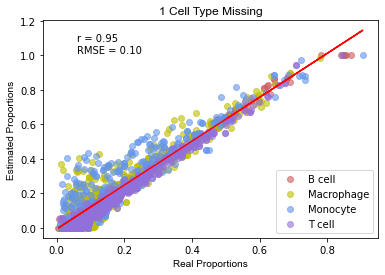

Index(['B cell', 'Dendritic cell', 'Monocyte'], dtype='object')
CategoricalIndex(['B cell', 'Dendritic cell', 'Monocyte'], categories=['B cell', 'Dendritic cell', 'Macrophage', 'Monocyte', 'T cell'], ordered=False, dtype='category')
Index(['B cell', 'Dendritic cell', 'Monocyte'], dtype='object')
['B cell', 'Dendritic cell', 'Monocyte']
Real Proportions shape: (398, 3)
Estimated Proportions shape: (398, 3)


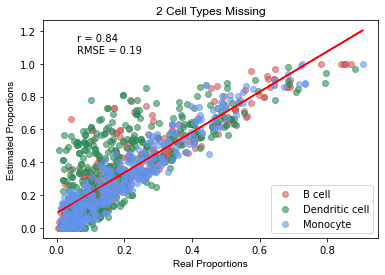

Index(['Macrophage', 'T cell'], dtype='object')
CategoricalIndex(['Macrophage', 'T cell'], categories=['B cell', 'Dendritic cell', 'Macrophage', 'Monocyte', 'T cell'], ordered=False, dtype='category')
Index(['Macrophage', 'T cell'], dtype='object')
['Macrophage', 'T cell']
Real Proportions shape: (398, 2)
Estimated Proportions shape: (398, 2)


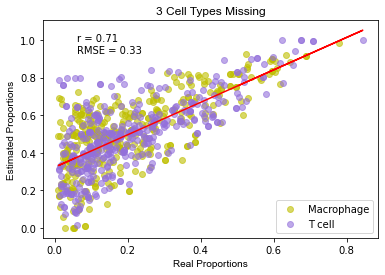

In [34]:
# Collecting all unique cell types across num_missing_cells
custom_colors = [ 'mediumpurple','cornflowerblue', 'indianred','y', 'seagreen', 'darkorange']
all_cell_types = set()
for num in num_missing_cells:
    all_cell_types.update(all_prop_refs_test[num].columns.tolist())

print(all_cell_types)

# Creating a fixed color mapping for all cell types
color_map = {cell_type: custom_colors[i % len(custom_colors)] for i, cell_type in enumerate(all_cell_types)}

for num in num_missing_cells:
    
    real_proportions = all_prop_refs_rebalanced_test[num].values.astype(float)
    estimated_proportions = calc_prop_tot_test[num].values.astype(float)
    cell_types = all_prop_refs_test[num].columns.tolist()

    print(all_prop_refs_rebalanced_test[num].columns)
    print(calc_prop_tot_test[num].columns)
    print(all_prop_refs_test[num].columns)
    print(cell_types)

    # Print the shapes of the matrices
    print("Real Proportions shape:", real_proportions.shape)
    print("Estimated Proportions shape:", estimated_proportions.shape)
    
    correlation_coefficient = np.corrcoef(real_proportions, estimated_proportions)[0, 1]
    
    # Scatter plot
    fig, ax = plt.subplots()
    for cell_type in cell_types:
        x = real_proportions[:, cell_types.index(cell_type)]
        y = estimated_proportions[:, cell_types.index(cell_type)]
        
        # Use the fixed color mapping
        color = color_map[cell_type]
        
        ax.scatter(x, y, label=cell_type, color=color, alpha=0.6)
    
    
    # Fit a regression line
    m, b = np.polyfit(real_proportions.flatten(), estimated_proportions.flatten(), 1)
    plt.plot(real_proportions.flatten(), m * real_proportions.flatten() + b, color="red")
    
    # Calculate r
    r, p = stats.pearsonr(real_proportions.flatten(), estimated_proportions.flatten())
    
    # Calculate RMSE
    rmse = np.sqrt(((real_proportions - estimated_proportions) ** 2).mean())
    
    # And annotate
    plt.annotate(f'r = {r:.2f}\nRMSE = {rmse:.2f}', xy=(0.1, 0.85), xycoords='axes fraction')
    
    plt.xlabel('Real Proportions', **font)
    plt.ylabel('Estimated Proportions', **font)
    if num == 1:
        plt.title(f'{num} Cell Type Missing', **font)
    else:    
        plt.title(f'{num} Cell Types Missing', **font)

    plt.legend(loc='lower right')  # show the cell type labels in the legend
    plt.show()


## **Recreated Matrices and Extracting Missing Cell Information**

Multiplying the reference and calculated proportions:

In [35]:
#recreate matrix with calculated proportion nnls and multiplying by the used reference
recreated_mat_all_train_1 = dict()
for num in num_missing_cells:
        recreated_mat_all_train_1[num] = pd.DataFrame(all_refs_train_1[num] @ calc_prop_tot_train_1[num].T)
        recreated_mat_all_train_1[num] = recreated_mat_all_train_1[num].T
        recreated_mat_all_train_1[num].columns = gene_ids
recreated_mat_all_train_1[0]    

,A2M,AAMDC,AATBC,ABCA10,ABCA5,ABCA6,ABCA8,ABCA9,ABCB10,ABCB4,...,GORASP2,GPALPP1,GPAT3,GPAT4,GPATCH11,GPC6,GPI,GPM6A,GPR132,GPR137B
0,0.544293,0.254337,0.243533,0.386080,0.431756,0.707684,0.256307,0.444570,0.357288,0.119679,...,0.275407,0.308585,0.366885,0.283283,0.155478,0.379870,0.327416,0.301631,0.288950,0.529532
1,0.803052,0.279142,0.026041,0.415691,0.642402,0.530403,0.266053,0.358415,0.228058,0.161297,...,0.269004,0.239026,0.135833,0.179910,0.180125,0.382876,0.249207,0.421458,0.208970,0.327721
2,0.910882,0.269544,0.003030,0.368236,0.647317,0.472515,0.255326,0.307831,0.216253,0.082663,...,0.259700,0.234723,0.085197,0.151549,0.154962,0.301899,0.227673,0.271561,0.186485,0.285345
3,0.973950,0.465481,0.025805,0.266686,0.350044,0.975406,0.479925,0.964687,0.329533,0.053678,...,0.271864,0.371472,0.209459,0.278373,0.214409,0.278520,0.323340,0.124106,0.349724,0.958964
4,0.967095,0.296575,0.035197,0.323177,0.565995,0.579003,0.285384,0.441907,0.265646,0.024507,...,0.248113,0.273577,0.256008,0.191614,0.165438,0.259108,0.250096,0.097898,0.233837,0.449615
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1585,0.905787,0.262944,0.046001,0.336667,0.593172,0.500508,0.251797,0.321947,0.246429,0.033429,...,0.255491,0.253084,0.140727,0.167931,0.140696,0.262470,0.238819,0.159907,0.200959,0.332465
1586,0.598327,0.253313,0.282597,0.328954,0.363079,0.744881,0.257966,0.481783,0.395455,0.031421,...,0.263878,0.335031,0.463495,0.301020,0.139291,0.304891,0.336485,0.094795,0.309446,0.607604
1587,0.906558,0.372118,0.078536,0.377762,0.493188,0.851578,0.360042,0.780321,0.346358,0.130068,...,0.240647,0.329543,0.710228,0.306705,0.267141,0.391646,0.317312,0.173444,0.355195,0.784010
1588,0.705393,0.259955,0.130950,0.382446,0.536445,0.593725,0.254385,0.373796,0.288933,0.109392,...,0.269496,0.271932,0.223898,0.220424,0.155065,0.349494,0.280537,0.305837,0.238900,0.406694


In [36]:
#recreate matrix with calculated proportion nnls and multiplying by the used reference
recreated_mat_all_train_2 = dict()
for num in num_missing_cells:
        recreated_mat_all_train_2[num] = pd.DataFrame(all_refs_train_2[num] @ calc_prop_tot_train_2[num].T)
        recreated_mat_all_train_2[num] = recreated_mat_all_train_2[num].T
        recreated_mat_all_train_2[num].columns = gene_ids
recreated_mat_all_train_2[0]    

,A2M,AAMDC,AATBC,ABCA10,ABCA5,ABCA6,ABCA8,ABCA9,ABCB10,ABCB4,...,GORASP2,GPALPP1,GPAT3,GPAT4,GPATCH11,GPC6,GPI,GPM6A,GPR132,GPR137B
0,0.544293,0.254337,0.243533,0.386080,0.431756,0.707684,0.256307,0.444570,0.357288,0.119679,...,0.275407,0.308585,0.366885,0.283283,0.155478,0.379870,0.327416,0.301631,0.288950,0.529532
1,0.803052,0.279142,0.026041,0.415691,0.642402,0.530403,0.266053,0.358415,0.228058,0.161297,...,0.269004,0.239026,0.135833,0.179910,0.180125,0.382876,0.249207,0.421458,0.208970,0.327721
2,0.910882,0.269544,0.003030,0.368236,0.647317,0.472515,0.255326,0.307831,0.216253,0.082663,...,0.259700,0.234723,0.085197,0.151549,0.154962,0.301899,0.227673,0.271561,0.186485,0.285345
3,0.973950,0.465481,0.025805,0.266686,0.350044,0.975406,0.479925,0.964687,0.329533,0.053678,...,0.271864,0.371472,0.209459,0.278373,0.214409,0.278520,0.323340,0.124106,0.349724,0.958964
4,0.967095,0.296575,0.035197,0.323177,0.565995,0.579003,0.285384,0.441907,0.265646,0.024507,...,0.248113,0.273577,0.256008,0.191614,0.165438,0.259108,0.250096,0.097898,0.233837,0.449615
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1585,0.905787,0.262944,0.046001,0.336667,0.593172,0.500508,0.251797,0.321947,0.246429,0.033429,...,0.255491,0.253084,0.140727,0.167931,0.140696,0.262470,0.238819,0.159907,0.200959,0.332465
1586,0.598327,0.253313,0.282597,0.328954,0.363079,0.744881,0.257966,0.481783,0.395455,0.031421,...,0.263878,0.335031,0.463495,0.301020,0.139291,0.304891,0.336485,0.094795,0.309446,0.607604
1587,0.906558,0.372118,0.078536,0.377762,0.493188,0.851578,0.360042,0.780321,0.346358,0.130068,...,0.240647,0.329543,0.710228,0.306705,0.267141,0.391646,0.317312,0.173444,0.355195,0.784010
1588,0.705393,0.259955,0.130950,0.382446,0.536445,0.593725,0.254385,0.373796,0.288933,0.109392,...,0.269496,0.271932,0.223898,0.220424,0.155065,0.349494,0.280537,0.305837,0.238900,0.406694


In [37]:
#recreate matrix with calculated proportion nnls and multiplying by the used reference
recreated_mat_all_train_3 = dict()
for num in num_missing_cells:
        recreated_mat_all_train_3[num] = pd.DataFrame(all_refs_train_3[num] @ calc_prop_tot_train_3[num].T)
        recreated_mat_all_train_3[num] = recreated_mat_all_train_3[num].T
        recreated_mat_all_train_3[num].columns = gene_ids
recreated_mat_all_train_3[0]    

,A2M,AAMDC,AATBC,ABCA10,ABCA5,ABCA6,ABCA8,ABCA9,ABCB10,ABCB4,...,GORASP2,GPALPP1,GPAT3,GPAT4,GPATCH11,GPC6,GPI,GPM6A,GPR132,GPR137B
0,0.544293,0.254337,0.243533,0.386080,0.431756,0.707684,0.256307,0.444570,0.357288,0.119679,...,0.275407,0.308585,0.366885,0.283283,0.155478,0.379870,0.327416,0.301631,0.288950,0.529532
1,0.803052,0.279142,0.026041,0.415691,0.642402,0.530403,0.266053,0.358415,0.228058,0.161297,...,0.269004,0.239026,0.135833,0.179910,0.180125,0.382876,0.249207,0.421458,0.208970,0.327721
2,0.910882,0.269544,0.003030,0.368236,0.647317,0.472515,0.255326,0.307831,0.216253,0.082663,...,0.259700,0.234723,0.085197,0.151549,0.154962,0.301899,0.227673,0.271561,0.186485,0.285345
3,0.973950,0.465481,0.025805,0.266686,0.350044,0.975406,0.479925,0.964687,0.329533,0.053678,...,0.271864,0.371472,0.209459,0.278373,0.214409,0.278520,0.323340,0.124106,0.349724,0.958964
4,0.967095,0.296575,0.035197,0.323177,0.565995,0.579003,0.285384,0.441907,0.265646,0.024507,...,0.248113,0.273577,0.256008,0.191614,0.165438,0.259108,0.250096,0.097898,0.233837,0.449615
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1585,0.905787,0.262944,0.046001,0.336667,0.593172,0.500508,0.251797,0.321947,0.246429,0.033429,...,0.255491,0.253084,0.140727,0.167931,0.140696,0.262470,0.238819,0.159907,0.200959,0.332465
1586,0.598327,0.253313,0.282597,0.328954,0.363079,0.744881,0.257966,0.481783,0.395455,0.031421,...,0.263878,0.335031,0.463495,0.301020,0.139291,0.304891,0.336485,0.094795,0.309446,0.607604
1587,0.906558,0.372118,0.078536,0.377762,0.493188,0.851578,0.360042,0.780321,0.346358,0.130068,...,0.240647,0.329543,0.710228,0.306705,0.267141,0.391646,0.317312,0.173444,0.355195,0.784010
1588,0.705393,0.259955,0.130950,0.382446,0.536445,0.593725,0.254385,0.373796,0.288933,0.109392,...,0.269496,0.271932,0.223898,0.220424,0.155065,0.349494,0.280537,0.305837,0.238900,0.406694


In [38]:
#recreate matrix with calculated proportion nnls and multiplying by the used reference
recreated_mat_all_train_4 = dict()
for num in num_missing_cells:
        recreated_mat_all_train_4[num] = pd.DataFrame(all_refs_train_4[num] @ calc_prop_tot_train_4[num].T)
        recreated_mat_all_train_4[num] = recreated_mat_all_train_4[num].T
        recreated_mat_all_train_4[num].columns = gene_ids
recreated_mat_all_train_4[0]    

,A2M,AAMDC,AATBC,ABCA10,ABCA5,ABCA6,ABCA8,ABCA9,ABCB10,ABCB4,...,GORASP2,GPALPP1,GPAT3,GPAT4,GPATCH11,GPC6,GPI,GPM6A,GPR132,GPR137B
0,0.544293,0.254337,0.243533,0.386080,0.431756,0.707684,0.256307,0.444570,0.357288,0.119679,...,0.275407,0.308585,0.366885,0.283283,0.155478,0.379870,0.327416,0.301631,0.288950,0.529532
1,0.803052,0.279142,0.026041,0.415691,0.642402,0.530403,0.266053,0.358415,0.228058,0.161297,...,0.269004,0.239026,0.135833,0.179910,0.180125,0.382876,0.249207,0.421458,0.208970,0.327721
2,0.910882,0.269544,0.003030,0.368236,0.647317,0.472515,0.255326,0.307831,0.216253,0.082663,...,0.259700,0.234723,0.085197,0.151549,0.154962,0.301899,0.227673,0.271561,0.186485,0.285345
3,0.973950,0.465481,0.025805,0.266686,0.350044,0.975406,0.479925,0.964687,0.329533,0.053678,...,0.271864,0.371472,0.209459,0.278373,0.214409,0.278520,0.323340,0.124106,0.349724,0.958964
4,0.967095,0.296575,0.035197,0.323177,0.565995,0.579003,0.285384,0.441907,0.265646,0.024507,...,0.248113,0.273577,0.256008,0.191614,0.165438,0.259108,0.250096,0.097898,0.233837,0.449615
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1585,0.905787,0.262944,0.046001,0.336667,0.593172,0.500508,0.251797,0.321947,0.246429,0.033429,...,0.255491,0.253084,0.140727,0.167931,0.140696,0.262470,0.238819,0.159907,0.200959,0.332465
1586,0.598327,0.253313,0.282597,0.328954,0.363079,0.744881,0.257966,0.481783,0.395455,0.031421,...,0.263878,0.335031,0.463495,0.301020,0.139291,0.304891,0.336485,0.094795,0.309446,0.607604
1587,0.906558,0.372118,0.078536,0.377762,0.493188,0.851578,0.360042,0.780321,0.346358,0.130068,...,0.240647,0.329543,0.710228,0.306705,0.267141,0.391646,0.317312,0.173444,0.355195,0.784010
1588,0.705393,0.259955,0.130950,0.382446,0.536445,0.593725,0.254385,0.373796,0.288933,0.109392,...,0.269496,0.271932,0.223898,0.220424,0.155065,0.349494,0.280537,0.305837,0.238900,0.406694


In [39]:
#recreate matrix with calculated proportion nnls and multiplying by the used reference
recreated_mat_all_train_5 = dict()
for num in num_missing_cells:
        recreated_mat_all_train_5[num] = pd.DataFrame(all_refs_train_5[num] @ calc_prop_tot_train_5[num].T)
        recreated_mat_all_train_5[num] = recreated_mat_all_train_5[num].T
        recreated_mat_all_train_5[num].columns = gene_ids
recreated_mat_all_train_5[0]    

,A2M,AAMDC,AATBC,ABCA10,ABCA5,ABCA6,ABCA8,ABCA9,ABCB10,ABCB4,...,GORASP2,GPALPP1,GPAT3,GPAT4,GPATCH11,GPC6,GPI,GPM6A,GPR132,GPR137B
0,0.544293,0.254337,0.243533,0.386080,0.431756,0.707684,0.256307,0.444570,0.357288,0.119679,...,0.275407,0.308585,0.366885,0.283283,0.155478,0.379870,0.327416,0.301631,0.288950,0.529532
1,0.803052,0.279142,0.026041,0.415691,0.642402,0.530403,0.266053,0.358415,0.228058,0.161297,...,0.269004,0.239026,0.135833,0.179910,0.180125,0.382876,0.249207,0.421458,0.208970,0.327721
2,0.910882,0.269544,0.003030,0.368236,0.647317,0.472515,0.255326,0.307831,0.216253,0.082663,...,0.259700,0.234723,0.085197,0.151549,0.154962,0.301899,0.227673,0.271561,0.186485,0.285345
3,0.973950,0.465481,0.025805,0.266686,0.350044,0.975406,0.479925,0.964687,0.329533,0.053678,...,0.271864,0.371472,0.209459,0.278373,0.214409,0.278520,0.323340,0.124106,0.349724,0.958964
4,0.967095,0.296575,0.035197,0.323177,0.565995,0.579003,0.285384,0.441907,0.265646,0.024507,...,0.248113,0.273577,0.256008,0.191614,0.165438,0.259108,0.250096,0.097898,0.233837,0.449615
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1585,0.905787,0.262944,0.046001,0.336667,0.593172,0.500508,0.251797,0.321947,0.246429,0.033429,...,0.255491,0.253084,0.140727,0.167931,0.140696,0.262470,0.238819,0.159907,0.200959,0.332465
1586,0.598327,0.253313,0.282597,0.328954,0.363079,0.744881,0.257966,0.481783,0.395455,0.031421,...,0.263878,0.335031,0.463495,0.301020,0.139291,0.304891,0.336485,0.094795,0.309446,0.607604
1587,0.906558,0.372118,0.078536,0.377762,0.493188,0.851578,0.360042,0.780321,0.346358,0.130068,...,0.240647,0.329543,0.710228,0.306705,0.267141,0.391646,0.317312,0.173444,0.355195,0.784010
1588,0.705393,0.259955,0.130950,0.382446,0.536445,0.593725,0.254385,0.373796,0.288933,0.109392,...,0.269496,0.271932,0.223898,0.220424,0.155065,0.349494,0.280537,0.305837,0.238900,0.406694


In [40]:
#recreate matrix with calculated proportion nnls and multiplying by the used reference
recreated_mat_all_test = dict()
for num in num_missing_cells:
        recreated_mat_all_test[num] = pd.DataFrame(all_refs_test[num] @ calc_prop_tot_test[num].T)
        recreated_mat_all_test[num] = recreated_mat_all_test[num].T
        recreated_mat_all_test[num].columns = gene_ids
recreated_mat_all_test[0]    

,A2M,AAMDC,AATBC,ABCA10,ABCA5,ABCA6,ABCA8,ABCA9,ABCB10,ABCB4,...,GORASP2,GPALPP1,GPAT3,GPAT4,GPATCH11,GPC6,GPI,GPM6A,GPR132,GPR137B
0,0.815950,0.361159,0.129783,0.385642,0.456502,0.880936,0.352364,0.779785,0.370183,0.141382,...,0.245791,0.339462,0.739698,0.327956,0.261803,0.409853,0.335021,0.197831,0.368234,0.805469
1,0.942112,0.408778,0.082777,0.380123,0.460995,0.961976,0.395435,0.933120,0.379607,0.142861,...,0.231494,0.355778,0.915478,0.349661,0.307794,0.416299,0.339335,0.132159,0.405640,0.936209
2,0.870792,0.417885,0.068069,0.312992,0.389589,0.913632,0.426870,0.849701,0.332390,0.093683,...,0.271509,0.352238,0.285299,0.282730,0.214185,0.327435,0.324256,0.204316,0.338688,0.855137
3,0.789605,0.331592,0.030684,0.396651,0.565491,0.660149,0.327836,0.522887,0.250937,0.170453,...,0.278452,0.271809,0.107969,0.209015,0.192159,0.388910,0.274898,0.434513,0.246123,0.491565
4,0.784733,0.351471,0.140332,0.389045,0.455847,0.865779,0.343662,0.749064,0.368378,0.144731,...,0.249255,0.335992,0.703815,0.324338,0.253167,0.412148,0.334877,0.218965,0.361050,0.778918
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
393,0.836163,0.366444,0.125632,0.330219,0.408653,0.864892,0.367118,0.756691,0.359367,0.078192,...,0.255982,0.345852,0.506593,0.300384,0.216186,0.333708,0.326784,0.130173,0.344056,0.794920
394,0.700758,0.301591,0.072243,0.439082,0.586657,0.644195,0.293225,0.471521,0.264912,0.212373,...,0.276496,0.263940,0.232930,0.227593,0.204106,0.442196,0.284194,0.499795,0.252975,0.450591
395,0.949823,0.435591,0.043291,0.335416,0.424425,0.953002,0.435295,0.932465,0.343683,0.115847,...,0.254053,0.355979,0.533437,0.307126,0.263083,0.361452,0.327292,0.172209,0.370180,0.921443
396,0.870292,0.384635,0.040003,0.402207,0.523899,0.832268,0.375368,0.765828,0.310682,0.183402,...,0.256200,0.313662,0.524584,0.283527,0.265419,0.427091,0.309216,0.329534,0.332804,0.737033


Missing Cell Information:

In [41]:
# Get the corresponding missing_cell_proportions
missing_cell_prop_train_1 = dict()
missing_cell_prop_train_1[0] = []
for num in num_missing_cells[1:]:
    missing_cell_prop_train_1[num] = training_props[missing_cell_tot_train_1[num].columns]  

In [42]:
# Get the corresponding missing_cell_proportions
missing_cell_prop_train_2 = dict()
missing_cell_prop_train_2[0] = []
for num in num_missing_cells[1:]:
    missing_cell_prop_train_2[num] = training_props[missing_cell_tot_train_2[num].columns]  

In [43]:
# Get the corresponding missing_cell_proportions
missing_cell_prop_train_3 = dict()
missing_cell_prop_train_3[0] = []
for num in num_missing_cells[1:]:
    missing_cell_prop_train_3[num] = training_props[missing_cell_tot_train_3[num].columns]  

In [44]:
# Get the corresponding missing_cell_proportions
missing_cell_prop_train_4 = dict()
missing_cell_prop_train_4[0] = []
for num in num_missing_cells[1:]:
    missing_cell_prop_train_4[num] = training_props[missing_cell_tot_train_4[num].columns]  

In [45]:
# Get the corresponding missing_cell_proportions
missing_cell_prop_train_5 = dict()
missing_cell_prop_train_5[0] = []
for num in num_missing_cells[1:]:
    missing_cell_prop_train_5[num] = training_props[missing_cell_tot_train_5[num].columns]  

In [46]:
# Get the corresponding missing_cell_proportions
missing_cell_prop_test = dict()
missing_cell_prop_test[0] = []
for num in num_missing_cells[1:]:
    missing_cell_prop_test[num] = testing_props[missing_cell_tot_test[num].columns]  

## **Calculate Residuals:**

Residual uses:

Pseudobulks - [Calculated_Proportions * Reference]

In [47]:
#Residual as the the difference between the recreated matrix and pseudobulks.
residuals_train_1 = dict()
for num in num_missing_cells:
    res = training_bulks.values - recreated_mat_all_train_1[num].values
    residuals_train_1[num] = pd.DataFrame(res, columns = gene_ids)
residuals_train_1[0]    

,A2M,AAMDC,AATBC,ABCA10,ABCA5,ABCA6,ABCA8,ABCA9,ABCB10,ABCB4,...,GORASP2,GPALPP1,GPAT3,GPAT4,GPATCH11,GPC6,GPI,GPM6A,GPR132,GPR137B
0,0.169604,-0.028358,0.346878,-0.023988,-0.039261,0.292316,-0.007559,-0.089537,0.198663,0.193663,...,0.103654,0.234840,0.016521,0.446075,0.109085,-0.185103,0.409764,0.065612,0.206848,-0.128233
1,0.196948,-0.021135,0.113685,0.077120,0.038126,0.402141,0.001058,-0.224936,0.079225,0.180196,...,0.131718,-0.018182,0.082020,0.019631,0.181526,-0.065046,0.090537,0.053404,0.047332,-0.177796
2,0.089118,-0.025771,0.124367,-0.078040,-0.050969,-0.142524,-0.133456,-0.222491,0.027086,0.133984,...,0.216834,0.072969,-0.003010,-0.016227,-0.089428,-0.069340,-0.070621,0.025768,-0.129763,-0.217879
3,0.026050,0.337010,0.112552,-0.235313,-0.168502,0.024594,0.366486,0.035313,0.185564,0.087081,...,0.284092,0.556567,0.110635,0.455572,0.244329,-0.205846,0.558070,-0.053406,0.261620,0.041036
4,0.032905,0.007696,0.096310,-0.138863,0.024269,0.420997,-0.053331,-0.005911,0.135775,0.099116,...,-0.002625,0.140815,0.029482,0.046918,0.072426,-0.096317,-0.048173,0.010115,-0.023753,-0.140269
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1585,0.094213,-0.099243,0.143040,0.107777,0.054901,-0.079360,-0.076505,-0.178621,0.048420,0.103658,...,0.239094,0.111680,-0.003487,0.056840,0.004935,0.018537,-0.008050,0.049834,-0.064405,-0.216523
1586,0.385325,-0.055804,0.417403,-0.023072,-0.136912,0.255119,0.010815,-0.006400,0.272396,0.090978,...,0.172945,0.181098,-0.098964,0.345769,-0.005796,-0.060705,0.394285,0.002613,0.272487,-0.144335
1587,0.093442,0.279128,0.143382,0.017009,-0.080409,0.148422,0.074014,0.085105,0.202487,0.183273,...,0.069823,0.241177,0.118321,0.385956,0.320237,-0.166839,0.237175,-0.006909,0.432621,-0.297253
1588,0.294607,-0.140738,0.204666,0.127358,0.051790,0.071726,-0.130846,-0.191629,0.048544,0.114598,...,0.069854,-0.003942,-0.000540,0.155722,-0.007007,-0.057828,0.059206,0.028020,0.118243,-0.204296


In [48]:
#Residual as the the difference between the recreated matrix and pseudobulks.
residuals_train_2 = dict()
for num in num_missing_cells:
    res = training_bulks.values - recreated_mat_all_train_2[num].values
    residuals_train_2[num] = pd.DataFrame(res, columns = gene_ids)
residuals_train_2[0]    

,A2M,AAMDC,AATBC,ABCA10,ABCA5,ABCA6,ABCA8,ABCA9,ABCB10,ABCB4,...,GORASP2,GPALPP1,GPAT3,GPAT4,GPATCH11,GPC6,GPI,GPM6A,GPR132,GPR137B
0,0.169604,-0.028358,0.346878,-0.023988,-0.039261,0.292316,-0.007559,-0.089537,0.198663,0.193663,...,0.103654,0.234840,0.016521,0.446075,0.109085,-0.185103,0.409764,0.065612,0.206848,-0.128233
1,0.196948,-0.021135,0.113685,0.077120,0.038126,0.402141,0.001058,-0.224936,0.079225,0.180196,...,0.131718,-0.018182,0.082020,0.019631,0.181526,-0.065046,0.090537,0.053404,0.047332,-0.177796
2,0.089118,-0.025771,0.124367,-0.078040,-0.050969,-0.142524,-0.133456,-0.222491,0.027086,0.133984,...,0.216834,0.072969,-0.003010,-0.016227,-0.089428,-0.069340,-0.070621,0.025768,-0.129763,-0.217879
3,0.026050,0.337010,0.112552,-0.235313,-0.168502,0.024594,0.366486,0.035313,0.185564,0.087081,...,0.284092,0.556567,0.110635,0.455572,0.244329,-0.205846,0.558070,-0.053406,0.261620,0.041036
4,0.032905,0.007696,0.096310,-0.138863,0.024269,0.420997,-0.053331,-0.005911,0.135775,0.099116,...,-0.002625,0.140815,0.029482,0.046918,0.072426,-0.096317,-0.048173,0.010115,-0.023753,-0.140269
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1585,0.094213,-0.099243,0.143040,0.107777,0.054901,-0.079360,-0.076505,-0.178621,0.048420,0.103658,...,0.239094,0.111680,-0.003487,0.056840,0.004935,0.018537,-0.008050,0.049834,-0.064405,-0.216523
1586,0.385325,-0.055804,0.417403,-0.023072,-0.136912,0.255119,0.010815,-0.006400,0.272396,0.090978,...,0.172945,0.181098,-0.098964,0.345769,-0.005796,-0.060705,0.394285,0.002613,0.272487,-0.144335
1587,0.093442,0.279128,0.143382,0.017009,-0.080409,0.148422,0.074014,0.085105,0.202487,0.183273,...,0.069823,0.241177,0.118321,0.385956,0.320237,-0.166839,0.237175,-0.006909,0.432621,-0.297253
1588,0.294607,-0.140738,0.204666,0.127358,0.051790,0.071726,-0.130846,-0.191629,0.048544,0.114598,...,0.069854,-0.003942,-0.000540,0.155722,-0.007007,-0.057828,0.059206,0.028020,0.118243,-0.204296


In [49]:
#Residual as the the difference between the recreated matrix and pseudobulks.
residuals_train_3 = dict()
for num in num_missing_cells:
    res = training_bulks.values - recreated_mat_all_train_3[num].values
    residuals_train_3[num] = pd.DataFrame(res, columns = gene_ids)
residuals_train_3[0]    

,A2M,AAMDC,AATBC,ABCA10,ABCA5,ABCA6,ABCA8,ABCA9,ABCB10,ABCB4,...,GORASP2,GPALPP1,GPAT3,GPAT4,GPATCH11,GPC6,GPI,GPM6A,GPR132,GPR137B
0,0.169604,-0.028358,0.346878,-0.023988,-0.039261,0.292316,-0.007559,-0.089537,0.198663,0.193663,...,0.103654,0.234840,0.016521,0.446075,0.109085,-0.185103,0.409764,0.065612,0.206848,-0.128233
1,0.196948,-0.021135,0.113685,0.077120,0.038126,0.402141,0.001058,-0.224936,0.079225,0.180196,...,0.131718,-0.018182,0.082020,0.019631,0.181526,-0.065046,0.090537,0.053404,0.047332,-0.177796
2,0.089118,-0.025771,0.124367,-0.078040,-0.050969,-0.142524,-0.133456,-0.222491,0.027086,0.133984,...,0.216834,0.072969,-0.003010,-0.016227,-0.089428,-0.069340,-0.070621,0.025768,-0.129763,-0.217879
3,0.026050,0.337010,0.112552,-0.235313,-0.168502,0.024594,0.366486,0.035313,0.185564,0.087081,...,0.284092,0.556567,0.110635,0.455572,0.244329,-0.205846,0.558070,-0.053406,0.261620,0.041036
4,0.032905,0.007696,0.096310,-0.138863,0.024269,0.420997,-0.053331,-0.005911,0.135775,0.099116,...,-0.002625,0.140815,0.029482,0.046918,0.072426,-0.096317,-0.048173,0.010115,-0.023753,-0.140269
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1585,0.094213,-0.099243,0.143040,0.107777,0.054901,-0.079360,-0.076505,-0.178621,0.048420,0.103658,...,0.239094,0.111680,-0.003487,0.056840,0.004935,0.018537,-0.008050,0.049834,-0.064405,-0.216523
1586,0.385325,-0.055804,0.417403,-0.023072,-0.136912,0.255119,0.010815,-0.006400,0.272396,0.090978,...,0.172945,0.181098,-0.098964,0.345769,-0.005796,-0.060705,0.394285,0.002613,0.272487,-0.144335
1587,0.093442,0.279128,0.143382,0.017009,-0.080409,0.148422,0.074014,0.085105,0.202487,0.183273,...,0.069823,0.241177,0.118321,0.385956,0.320237,-0.166839,0.237175,-0.006909,0.432621,-0.297253
1588,0.294607,-0.140738,0.204666,0.127358,0.051790,0.071726,-0.130846,-0.191629,0.048544,0.114598,...,0.069854,-0.003942,-0.000540,0.155722,-0.007007,-0.057828,0.059206,0.028020,0.118243,-0.204296


In [50]:
#Residual as the the difference between the recreated matrix and pseudobulks.
residuals_train_4 = dict()
for num in num_missing_cells:
    res = training_bulks.values - recreated_mat_all_train_4[num].values
    residuals_train_4[num] = pd.DataFrame(res, columns = gene_ids)
residuals_train_4[0]    

,A2M,AAMDC,AATBC,ABCA10,ABCA5,ABCA6,ABCA8,ABCA9,ABCB10,ABCB4,...,GORASP2,GPALPP1,GPAT3,GPAT4,GPATCH11,GPC6,GPI,GPM6A,GPR132,GPR137B
0,0.169604,-0.028358,0.346878,-0.023988,-0.039261,0.292316,-0.007559,-0.089537,0.198663,0.193663,...,0.103654,0.234840,0.016521,0.446075,0.109085,-0.185103,0.409764,0.065612,0.206848,-0.128233
1,0.196948,-0.021135,0.113685,0.077120,0.038126,0.402141,0.001058,-0.224936,0.079225,0.180196,...,0.131718,-0.018182,0.082020,0.019631,0.181526,-0.065046,0.090537,0.053404,0.047332,-0.177796
2,0.089118,-0.025771,0.124367,-0.078040,-0.050969,-0.142524,-0.133456,-0.222491,0.027086,0.133984,...,0.216834,0.072969,-0.003010,-0.016227,-0.089428,-0.069340,-0.070621,0.025768,-0.129763,-0.217879
3,0.026050,0.337010,0.112552,-0.235313,-0.168502,0.024594,0.366486,0.035313,0.185564,0.087081,...,0.284092,0.556567,0.110635,0.455572,0.244329,-0.205846,0.558070,-0.053406,0.261620,0.041036
4,0.032905,0.007696,0.096310,-0.138863,0.024269,0.420997,-0.053331,-0.005911,0.135775,0.099116,...,-0.002625,0.140815,0.029482,0.046918,0.072426,-0.096317,-0.048173,0.010115,-0.023753,-0.140269
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1585,0.094213,-0.099243,0.143040,0.107777,0.054901,-0.079360,-0.076505,-0.178621,0.048420,0.103658,...,0.239094,0.111680,-0.003487,0.056840,0.004935,0.018537,-0.008050,0.049834,-0.064405,-0.216523
1586,0.385325,-0.055804,0.417403,-0.023072,-0.136912,0.255119,0.010815,-0.006400,0.272396,0.090978,...,0.172945,0.181098,-0.098964,0.345769,-0.005796,-0.060705,0.394285,0.002613,0.272487,-0.144335
1587,0.093442,0.279128,0.143382,0.017009,-0.080409,0.148422,0.074014,0.085105,0.202487,0.183273,...,0.069823,0.241177,0.118321,0.385956,0.320237,-0.166839,0.237175,-0.006909,0.432621,-0.297253
1588,0.294607,-0.140738,0.204666,0.127358,0.051790,0.071726,-0.130846,-0.191629,0.048544,0.114598,...,0.069854,-0.003942,-0.000540,0.155722,-0.007007,-0.057828,0.059206,0.028020,0.118243,-0.204296


In [51]:
#Residual as the the difference between the recreated matrix and pseudobulks.
residuals_train_5 = dict()
for num in num_missing_cells:
    res = training_bulks.values - recreated_mat_all_train_5[num].values
    residuals_train_5[num] = pd.DataFrame(res, columns = gene_ids)
residuals_train_5[0]    

,A2M,AAMDC,AATBC,ABCA10,ABCA5,ABCA6,ABCA8,ABCA9,ABCB10,ABCB4,...,GORASP2,GPALPP1,GPAT3,GPAT4,GPATCH11,GPC6,GPI,GPM6A,GPR132,GPR137B
0,0.169604,-0.028358,0.346878,-0.023988,-0.039261,0.292316,-0.007559,-0.089537,0.198663,0.193663,...,0.103654,0.234840,0.016521,0.446075,0.109085,-0.185103,0.409764,0.065612,0.206848,-0.128233
1,0.196948,-0.021135,0.113685,0.077120,0.038126,0.402141,0.001058,-0.224936,0.079225,0.180196,...,0.131718,-0.018182,0.082020,0.019631,0.181526,-0.065046,0.090537,0.053404,0.047332,-0.177796
2,0.089118,-0.025771,0.124367,-0.078040,-0.050969,-0.142524,-0.133456,-0.222491,0.027086,0.133984,...,0.216834,0.072969,-0.003010,-0.016227,-0.089428,-0.069340,-0.070621,0.025768,-0.129763,-0.217879
3,0.026050,0.337010,0.112552,-0.235313,-0.168502,0.024594,0.366486,0.035313,0.185564,0.087081,...,0.284092,0.556567,0.110635,0.455572,0.244329,-0.205846,0.558070,-0.053406,0.261620,0.041036
4,0.032905,0.007696,0.096310,-0.138863,0.024269,0.420997,-0.053331,-0.005911,0.135775,0.099116,...,-0.002625,0.140815,0.029482,0.046918,0.072426,-0.096317,-0.048173,0.010115,-0.023753,-0.140269
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1585,0.094213,-0.099243,0.143040,0.107777,0.054901,-0.079360,-0.076505,-0.178621,0.048420,0.103658,...,0.239094,0.111680,-0.003487,0.056840,0.004935,0.018537,-0.008050,0.049834,-0.064405,-0.216523
1586,0.385325,-0.055804,0.417403,-0.023072,-0.136912,0.255119,0.010815,-0.006400,0.272396,0.090978,...,0.172945,0.181098,-0.098964,0.345769,-0.005796,-0.060705,0.394285,0.002613,0.272487,-0.144335
1587,0.093442,0.279128,0.143382,0.017009,-0.080409,0.148422,0.074014,0.085105,0.202487,0.183273,...,0.069823,0.241177,0.118321,0.385956,0.320237,-0.166839,0.237175,-0.006909,0.432621,-0.297253
1588,0.294607,-0.140738,0.204666,0.127358,0.051790,0.071726,-0.130846,-0.191629,0.048544,0.114598,...,0.069854,-0.003942,-0.000540,0.155722,-0.007007,-0.057828,0.059206,0.028020,0.118243,-0.204296


In [52]:
#Residual as the the difference between the recreated matrix and pseudobulks.
residuals_test = dict()
for num in num_missing_cells:
    res = testing_bulks.values - recreated_mat_all_test[num].values
    residuals_test[num] = pd.DataFrame(res, columns = gene_ids)
residuals_test[0]    

,A2M,AAMDC,AATBC,ABCA10,ABCA5,ABCA6,ABCA8,ABCA9,ABCB10,ABCB4,...,GORASP2,GPALPP1,GPAT3,GPAT4,GPATCH11,GPC6,GPI,GPM6A,GPR132,GPR137B
0,0.184050,0.158414,0.219532,-0.009171,-0.059950,0.119064,0.076684,-0.118407,0.267472,0.200111,...,0.093559,0.226295,0.183621,0.458742,0.395964,0.006814,0.408568,0.033512,0.415380,-0.181281
1,0.057888,0.349229,0.165169,0.099615,-0.113125,0.038024,-0.014801,-0.245483,0.208315,0.241472,...,-0.058209,0.339012,0.084522,0.391164,0.570846,-0.229284,0.375409,-0.012363,0.550242,-0.220067
2,0.129208,0.236919,0.136040,-0.079005,-0.119812,0.086368,0.272629,0.150299,0.246651,0.140099,...,0.324159,0.444288,-0.002562,0.281490,0.261543,-0.217939,0.297539,-0.014214,0.333581,0.144863
3,0.210395,0.018942,0.089864,0.020342,-0.009710,0.339851,0.074501,0.474925,0.095422,0.211431,...,0.190862,0.281540,0.010395,0.144196,0.157356,-0.123406,0.013564,0.054490,0.119423,0.036172
4,0.215267,0.255290,0.207613,0.016184,-0.118119,0.134221,0.062014,-0.085497,0.281711,0.199211,...,0.256160,0.257060,0.064569,0.393552,0.438580,-0.137923,0.270892,0.032802,0.491891,-0.277668
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
393,0.163837,0.247435,0.238752,-0.063552,-0.122649,0.135108,0.160428,0.243309,0.310260,0.113974,...,0.133909,0.259607,0.040792,0.339524,0.242552,0.026757,0.493728,-0.037871,0.336616,0.030667
394,0.299242,0.096985,0.149675,0.106016,0.084742,0.355805,0.040665,0.079355,0.100985,0.225816,...,0.293902,0.004051,0.008124,0.164609,0.201234,0.016137,-0.002143,0.033983,0.087361,-0.110261
395,0.050177,0.288609,0.123833,-0.055677,-0.132336,0.046998,0.242502,0.067535,0.178520,0.175463,...,0.189990,0.291663,0.162592,0.419938,0.440800,-0.170560,0.294503,0.004931,0.438644,0.078057
396,0.129708,0.175864,0.170956,0.017400,-0.090836,0.167732,0.041994,0.234172,0.215073,0.172780,...,0.061489,0.420829,0.074315,0.402252,0.287980,-0.067595,0.267707,0.053812,0.377281,-0.103850


## Neural Network

In [53]:
# Prepare the data for training
X_train = []
y_train = []

for num_missing, df in residuals_train_1.items():
    X_train.append(df.values)
    y_train.extend([num_missing] * len(df))
for num_missing, df in residuals_train_2.items():
    X_train.append(df.values)
    y_train.extend([num_missing] * len(df))
for num_missing, df in residuals_train_3.items():
    X_train.append(df.values)
    y_train.extend([num_missing] * len(df))
for num_missing, df in residuals_train_4.items():
    X_train.append(df.values)
    y_train.extend([num_missing] * len(df))
for num_missing, df in residuals_train_5.items():
    X_train.append(df.values)
    y_train.extend([num_missing] * len(df))

# Prepare the data for training
X_test = []
y_test= []

for num_missing, df in residuals_test.items():
    X_test.append(df.values)
    y_test.extend([num_missing] * len(df))

# Combine all data into single arrays
X_train = np.vstack(X_train)
y_train = np.array(y_train)
X_test = np.vstack(X_test)
y_test= np.array(y_test)

In [54]:
# Define the neural network
class ResidualClassifier(nn.Module):
    def __init__(self, input_size, num_classes):
        super(ResidualClassifier, self).__init__()
        self.fc1 = nn.Linear(input_size, 128)
        self.relu = nn.ReLU()
        self.fc2 = nn.Linear(128, 64)
        self.fc3 = nn.Linear(64, num_classes)
        self.softmax = nn.Softmax(dim=1)
    
    def forward(self, x):
        x = self.fc1(x)
        x = self.relu(x)
        x = self.fc2(x)
        x = self.relu(x)
        x = self.fc3(x)
        return self.softmax(x)

# Prepare data
# Combine and shuffle the training data

X_train, y_train = shuffle(X_train, y_train, random_state=42)
X_train_tensor = torch.tensor(X_train, dtype=torch.float32)
y_train_tensor = torch.tensor(y_train, dtype=torch.long)
X_test_tensor = torch.tensor(X_test, dtype=torch.float32)
y_test_tensor = torch.tensor(y_test, dtype=torch.long)

# Create a TensorDataset and DataLoader for batching
train_dataset = TensorDataset(X_train_tensor, y_train_tensor)
train_loader = DataLoader(train_dataset, batch_size=100, shuffle=True)  # Use a batch size of 32

# Initialize model, loss, and optimizer
input_size = X_train.shape[1]
num_classes = len(set(y_train))
model = ResidualClassifier(input_size, num_classes)
criterion = nn.CrossEntropyLoss()
optimizer = optim.Adam(model.parameters(), lr=0.001)
epochs=40
# Training loop with batching
for epoch in range(epochs):
    model.train()
    epoch_loss = 0.0
    for X_batch, y_batch in train_loader:  # Iterate over batches
        optimizer.zero_grad()
        outputs = model(X_batch)
        loss = criterion(outputs, y_batch)
        loss.backward()
        optimizer.step()
        epoch_loss += loss.item()  # Accumulate loss for the epoch
    # Print average loss for every 10 epochs
    if (epoch + 1) % 10 == 0:
        print(f"Epoch [{epoch+1}/{epochs}], Loss: {epoch_loss / len(train_loader):.4f}")


Epoch [10/40], Loss: 0.9274
Epoch [20/40], Loss: 0.9196
Epoch [30/40], Loss: 0.9173
Epoch [40/40], Loss: 0.9157


In [55]:
# Create a DataLoader for test data
test_dataset = TensorDataset(X_test_tensor, y_test_tensor)
test_loader = DataLoader(test_dataset, batch_size=32, shuffle=False)  # Use a batch size of 32

# Evaluate on test data in batches
model.eval()
y_pred = []
with torch.no_grad():
    for X_batch, _ in test_loader:  # Iterate over test batches
        outputs = model(X_batch)
        y_pred.extend(torch.argmax(outputs, dim=1).cpu().numpy())  # Collect predictions

# Convert predictions to a numpy array
y_pred = np.array(y_pred)

In [56]:
# Generate classification report
classification_report_str = classification_report(y_test, y_pred)
confusion_matrix_array = confusion_matrix(y_test, y_pred)
print("Classification Report:\n", classification_report_str)
print("Confusion Matrix:\n", confusion_matrix_array)

Classification Report:
               precision    recall  f1-score   support

           0       0.73      0.98      0.84       398
           1       0.05      0.01      0.01       398
           2       0.36      0.88      0.51       398
           3       0.78      0.10      0.17       398

    accuracy                           0.49      1592
   macro avg       0.48      0.49      0.38      1592
weighted avg       0.48      0.49      0.38      1592

Confusion Matrix:
 [[391   7   0   0]
 [119   2 270   7]
 [ 22  23 349   4]
 [  3   5 351  39]]


## KNN Classifier

In [57]:
# Standardize the data for KNN
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

# Initialize the KNN classifier
knn_classifier = KNeighborsClassifier(n_neighbors=5, weights='distance')  # Use 5 neighbors and weighted distances
knn_classifier.fit(X_train_scaled, y_train)

# Evaluate the model
y_pred = knn_classifier.predict(X_test_scaled)
classification_report_str = classification_report(y_test, y_pred)
confusion_matrix_array = confusion_matrix(y_test, y_pred)

# Output results
print("Classification Report:\n", classification_report_str)
print("Confusion Matrix:\n", confusion_matrix_array)


Classification Report:
               precision    recall  f1-score   support

           0       0.60      0.91      0.73       398
           1       0.04      0.02      0.02       398
           2       0.36      0.66      0.46       398
           3       0.94      0.22      0.36       398

    accuracy                           0.45      1592
   macro avg       0.48      0.45      0.39      1592
weighted avg       0.48      0.45      0.39      1592

Confusion Matrix:
 [[364  22  11   1]
 [205   6 185   2]
 [ 28 105 262   3]
 [  7  30 272  89]]


## XGBoost

In [58]:
# Initialize and train the XGBoost classifier
xgb_classifier = XGBClassifier(random_state=42, use_label_encoder=False, eval_metric='mlogloss')
xgb_classifier.fit(X_train, y_train)

# Evaluate the model
y_pred = xgb_classifier.predict(X_test)
classification_report_str = classification_report(y_test, y_pred)
confusion_matrix_array = confusion_matrix(y_test, y_pred)
print(classification_report)
print(confusion_matrix_array)

/Users/ivicha/anaconda3/envs/env_ml/lib/python3.9/site-packages/xgboost/core.py:158: UserWarning: [16:20:28] WARNING: /Users/runner/miniforge3/conda-bld/xgboost-split_1733179641447/work/src/learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)


<function classification_report at 0x12a540c10>
[[371  20   4   3]
 [177   8 209   4]
 [ 11  44 326  17]
 [  2   1 393   2]]


## Random Forest

In [59]:
# Train the Random Forest Classifier
rf_classifier = RandomForestClassifier(random_state=42, n_estimators=100)
rf_classifier.fit(X_train, y_train)

# Evaluate the model
y_pred = rf_classifier.predict(X_test)
classification_report_str = classification_report(y_test, y_pred)
confusion_matrix_array = confusion_matrix(y_test, y_pred)

# Output results
results = {
    "Classification Report": classification_report_str,
    "Confusion Matrix": confusion_matrix_array,
}

results

{'Classification Report': '              precision    recall  f1-score   support\n\n           0       0.71      0.95      0.81       398\n           1       0.11      0.03      0.04       398\n           2       0.33      0.78      0.47       398\n           3       0.49      0.05      0.09       398\n\n    accuracy                           0.45      1592\n   macro avg       0.41      0.45      0.35      1592\nweighted avg       0.41      0.45      0.35      1592\n',
 'Confusion Matrix': array([[377,  13,   8,   0],
        [141,  10, 245,   2],
        [ 12,  56, 312,  18],
        [  2,   8, 369,  19]])}

## **Singular Value Decomposition**

SVD on each residual matrix. For this purposes, we will only focus on U and S.

U: Left singular vectors, representing the column space of the original matrix. (cells)

Σ or sigma: Singular values, representing the diagonal matrix of singular values.

Vh or V^T: Right singular vectors, representing the row space of the original matrix. (sample)

Calculating SVD

In [60]:
num_cells_missing = num_missing_cells #for each number of missing cells
num_celltypes = len(sn_adata.obs['cell_types'].unique())

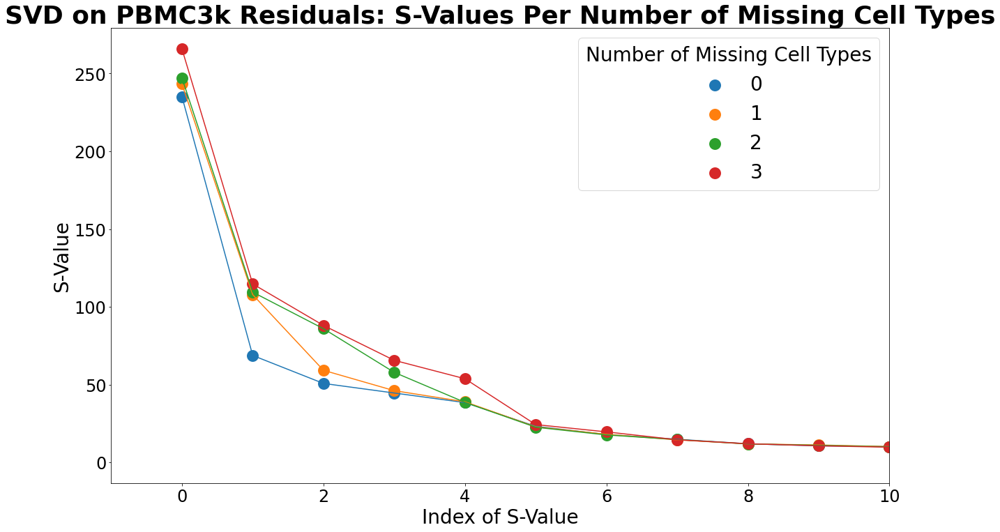

In [61]:
# SVD on residual 1
U_all = dict()
s_all = dict()
V_all = dict()
Matres_all = dict()

for num in num_cells_missing:
    df = residuals_train_1[num]
    Mat = df.astype("float32")
    U, s, V = sp.linalg.svd(Mat)
    U = pd.DataFrame(U)
    s = pd.DataFrame(s)
    V = pd.DataFrame(V)

    U_all[num] = U
    s_all[num] = s
    V_all[num] = V
    Matres_all[num] = Mat

plt.figure(figsize = [20,12])
# Create a color map for differentiating num 
color_map = plt.cm.get_cmap('tab10')
# Plotting the scatterplots
for num in num_missing_cells:
    dataframe = s_all[num]
    x = dataframe.index
    y = dataframe.values.flatten()
    color = color_map(num_missing_cells.index(num))
    label = f"{num}"
    plt.plot(x, y, color=color)
    plt.scatter(x, y, color=color, lw=8, s=80,  label=label)
# Set labels and title
plt.xlabel('Index of S-Value', fontsize=28)
plt.ylabel('S-Value', fontsize=28)
plt.title('SVD on PBMC3k Residuals: S-Values Per Number of Missing Cell Types', fontsize=36, fontweight="bold")
plt.xlim([-1,num_celltypes + 5])
plt.xticks(fontsize=24)
plt.yticks(fontsize=24)
# Add a legend
plt.legend(title= "Number of Missing Cell Types", fontsize=28, title_fontsize=28)
# Display the plot
plt.show()

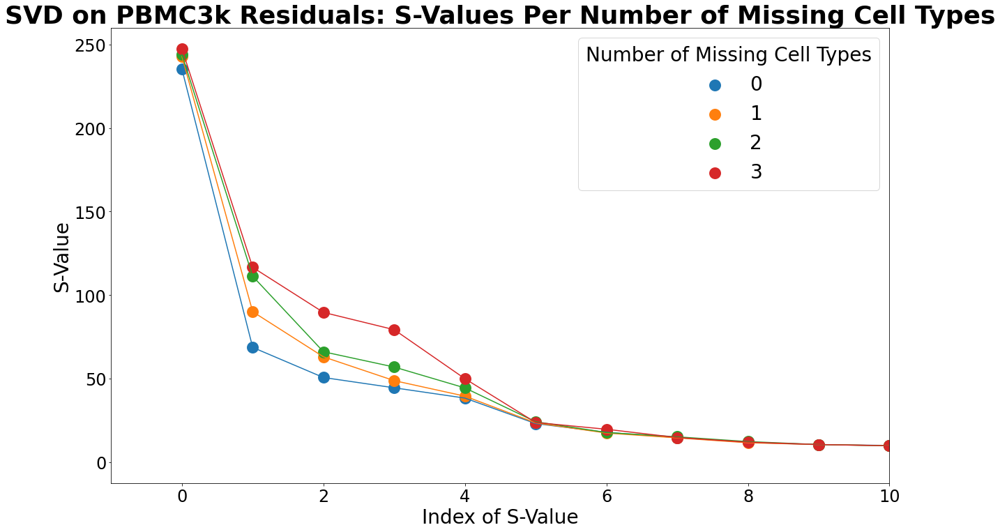

In [62]:
# SVD on residual 1
U_all = dict()
s_all = dict()
V_all = dict()
Matres_all = dict()

for num in num_cells_missing:
    df = residuals_train_2[num]
    Mat = df.astype("float32")
    U, s, V = sp.linalg.svd(Mat)
    U = pd.DataFrame(U)
    s = pd.DataFrame(s)
    V = pd.DataFrame(V)

    U_all[num] = U
    s_all[num] = s
    V_all[num] = V
    Matres_all[num] = Mat

plt.figure(figsize = [20,12])
# Create a color map for differentiating num 
color_map = plt.cm.get_cmap('tab10')
# Plotting the scatterplots
for num in num_missing_cells:
    dataframe = s_all[num]
    x = dataframe.index
    y = dataframe.values.flatten()
    color = color_map(num_missing_cells.index(num))
    label = f"{num}"
    plt.plot(x, y, color=color)
    plt.scatter(x, y, color=color, lw=8, s=80,  label=label)
# Set labels and title
plt.xlabel('Index of S-Value', fontsize=28)
plt.ylabel('S-Value', fontsize=28)
plt.title('SVD on PBMC3k Residuals: S-Values Per Number of Missing Cell Types', fontsize=36, fontweight="bold")
plt.xlim([-1,num_celltypes + 5])
plt.xticks(fontsize=24)
plt.yticks(fontsize=24)
# Add a legend
plt.legend(title= "Number of Missing Cell Types", fontsize=28, title_fontsize=28)
# Display the plot
plt.show()

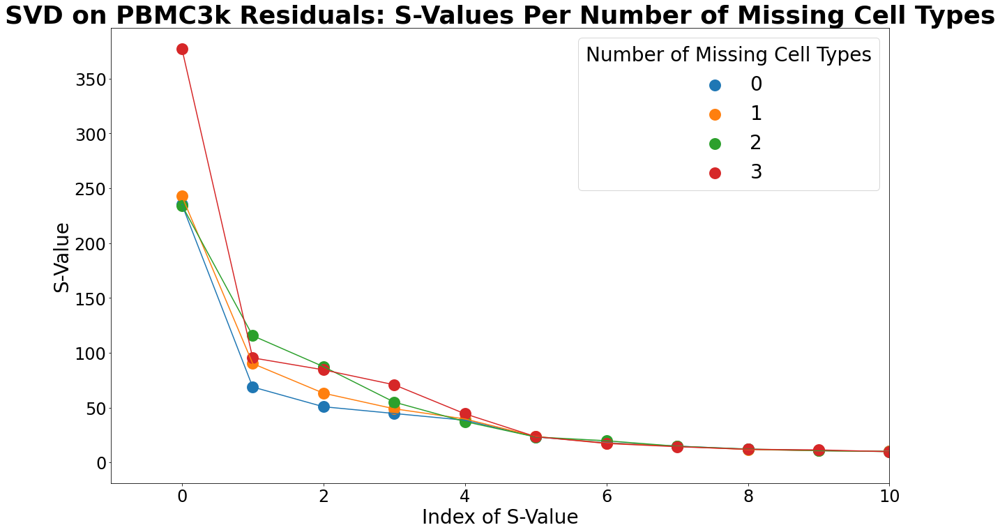

In [63]:
# SVD on residual 1
U_all = dict()
s_all = dict()
V_all = dict()
Matres_all = dict()

for num in num_cells_missing:
    df = residuals_train_3[num]
    Mat = df.astype("float32")
    U, s, V = sp.linalg.svd(Mat)
    U = pd.DataFrame(U)
    s = pd.DataFrame(s)
    V = pd.DataFrame(V)

    U_all[num] = U
    s_all[num] = s
    V_all[num] = V
    Matres_all[num] = Mat

plt.figure(figsize = [20,12])
# Create a color map for differentiating num 
color_map = plt.cm.get_cmap('tab10')
# Plotting the scatterplots
for num in num_missing_cells:
    dataframe = s_all[num]
    x = dataframe.index
    y = dataframe.values.flatten()
    color = color_map(num_missing_cells.index(num))
    label = f"{num}"
    plt.plot(x, y, color=color)
    plt.scatter(x, y, color=color, lw=8, s=80,  label=label)
# Set labels and title
plt.xlabel('Index of S-Value', fontsize=28)
plt.ylabel('S-Value', fontsize=28)
plt.title('SVD on PBMC3k Residuals: S-Values Per Number of Missing Cell Types', fontsize=36, fontweight="bold")
plt.xlim([-1,num_celltypes + 5])
plt.xticks(fontsize=24)
plt.yticks(fontsize=24)
# Add a legend
plt.legend(title= "Number of Missing Cell Types", fontsize=28, title_fontsize=28)
# Display the plot
plt.show()

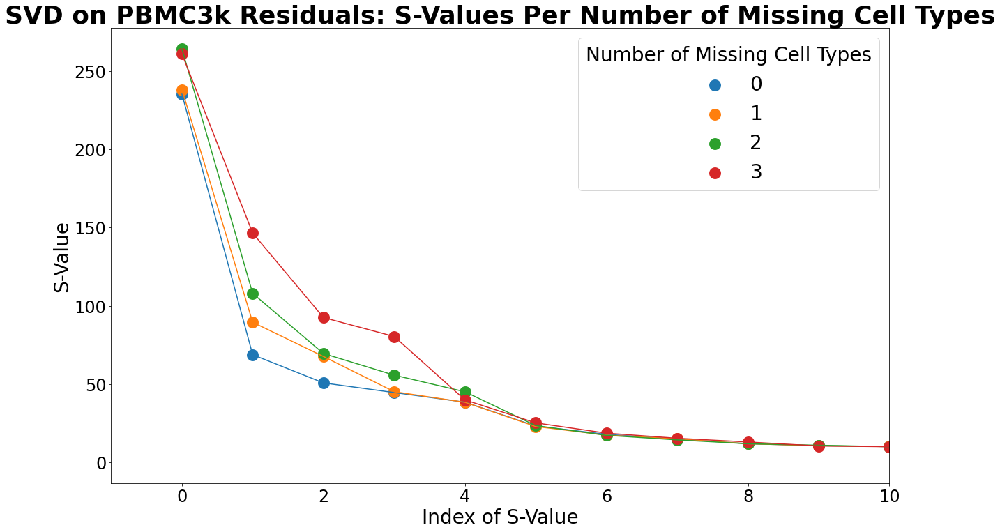

In [64]:
# SVD on residual 1
U_all = dict()
s_all = dict()
V_all = dict()
Matres_all = dict()

for num in num_cells_missing:
    df = residuals_train_4[num]
    Mat = df.astype("float32")
    U, s, V = sp.linalg.svd(Mat)
    U = pd.DataFrame(U)
    s = pd.DataFrame(s)
    V = pd.DataFrame(V)

    U_all[num] = U
    s_all[num] = s
    V_all[num] = V
    Matres_all[num] = Mat

plt.figure(figsize = [20,12])
# Create a color map for differentiating num 
color_map = plt.cm.get_cmap('tab10')
# Plotting the scatterplots
for num in num_missing_cells:
    dataframe = s_all[num]
    x = dataframe.index
    y = dataframe.values.flatten()
    color = color_map(num_missing_cells.index(num))
    label = f"{num}"
    plt.plot(x, y, color=color)
    plt.scatter(x, y, color=color, lw=8, s=80,  label=label)
# Set labels and title
plt.xlabel('Index of S-Value', fontsize=28)
plt.ylabel('S-Value', fontsize=28)
plt.title('SVD on PBMC3k Residuals: S-Values Per Number of Missing Cell Types', fontsize=36, fontweight="bold")
plt.xlim([-1,num_celltypes + 5])
plt.xticks(fontsize=24)
plt.yticks(fontsize=24)
# Add a legend
plt.legend(title= "Number of Missing Cell Types", fontsize=28, title_fontsize=28)
# Display the plot
plt.show()

## UMAP and KNN

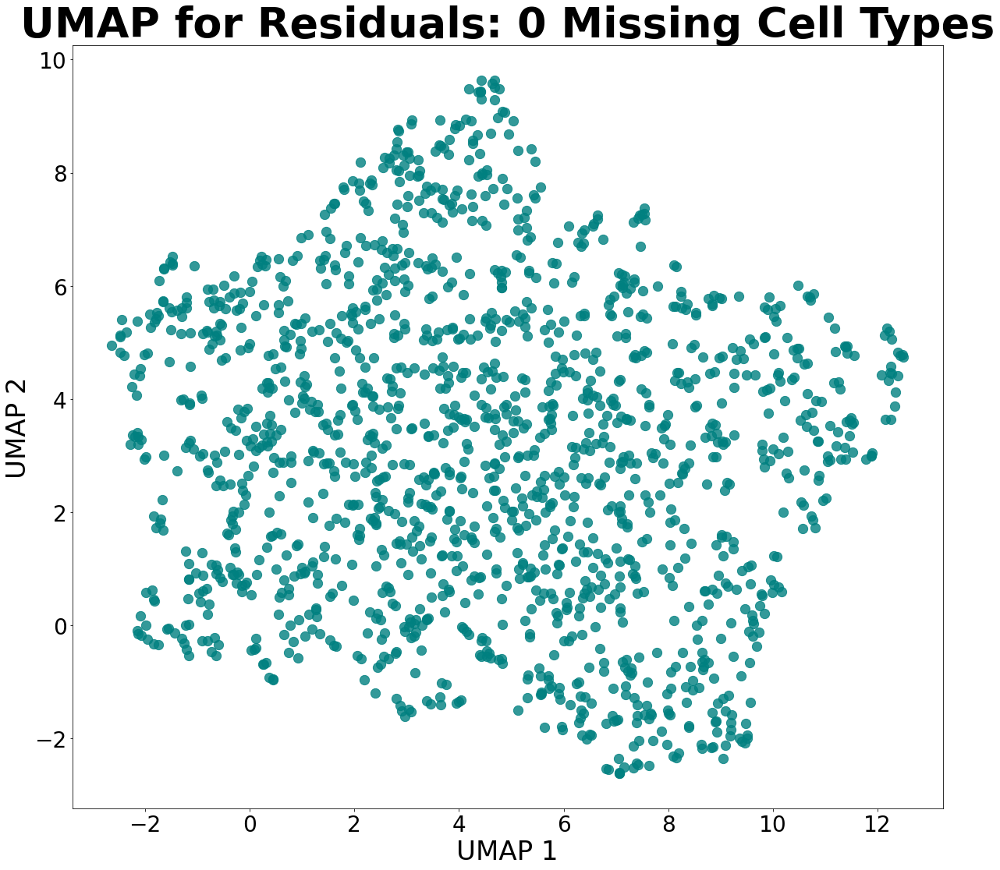

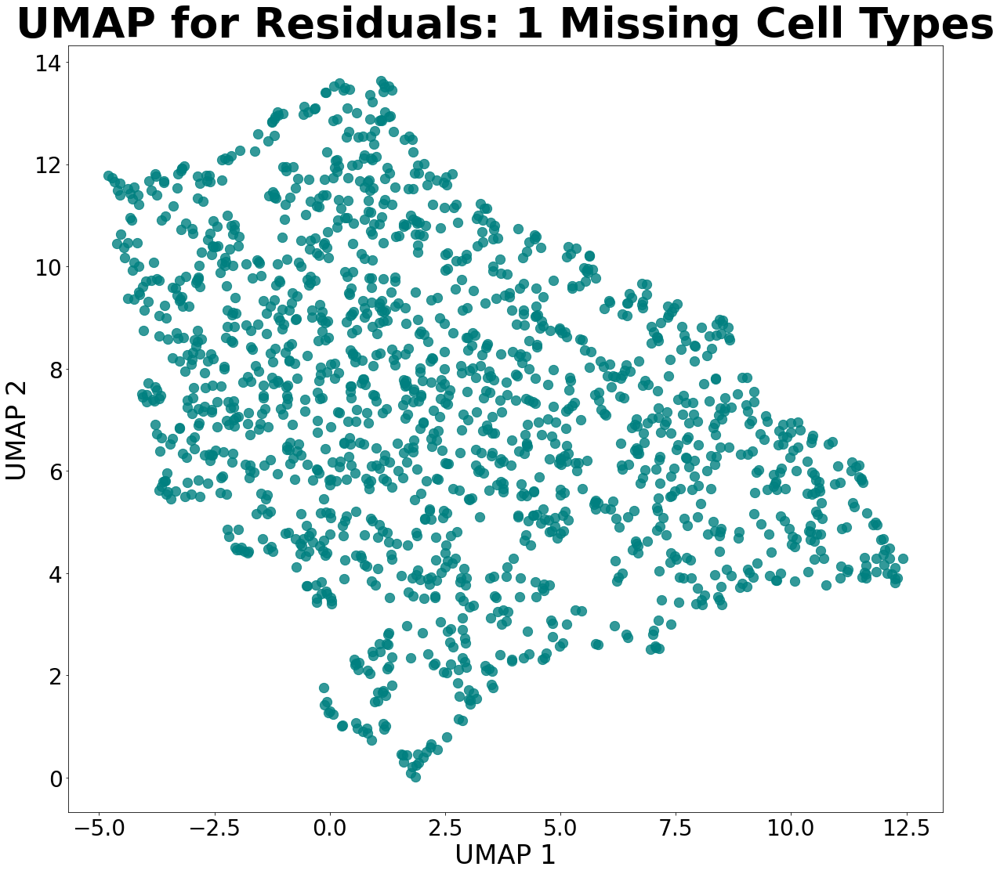

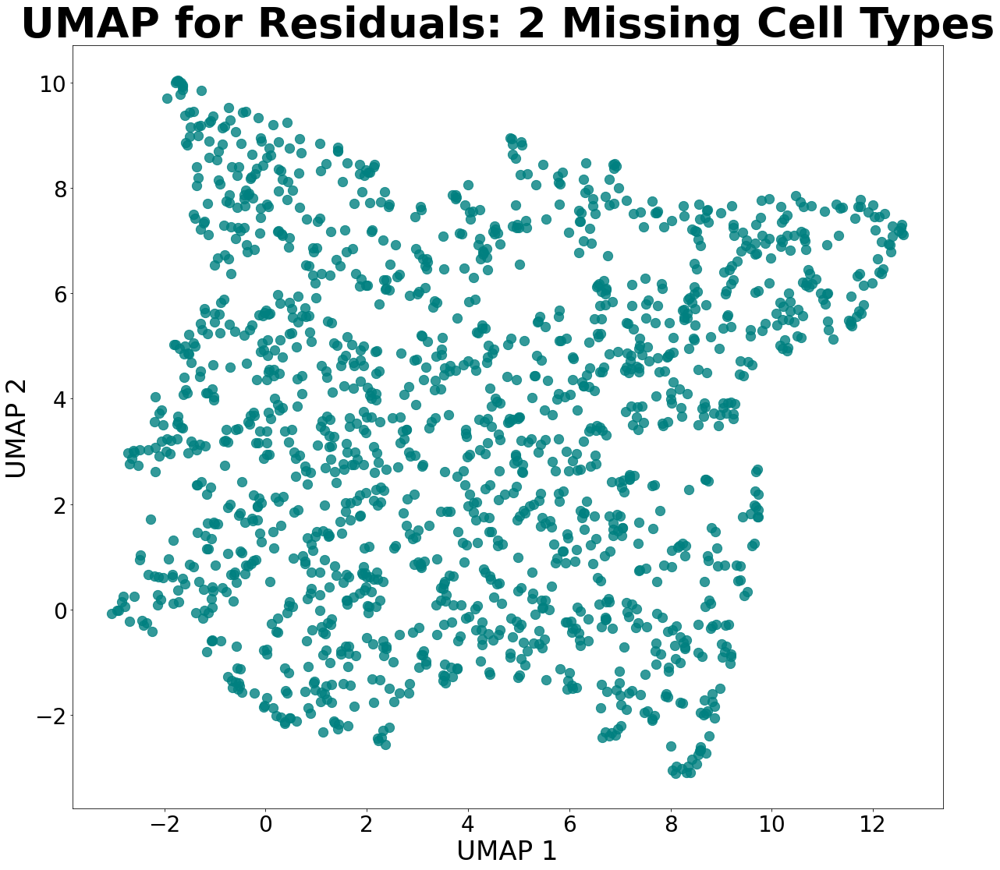

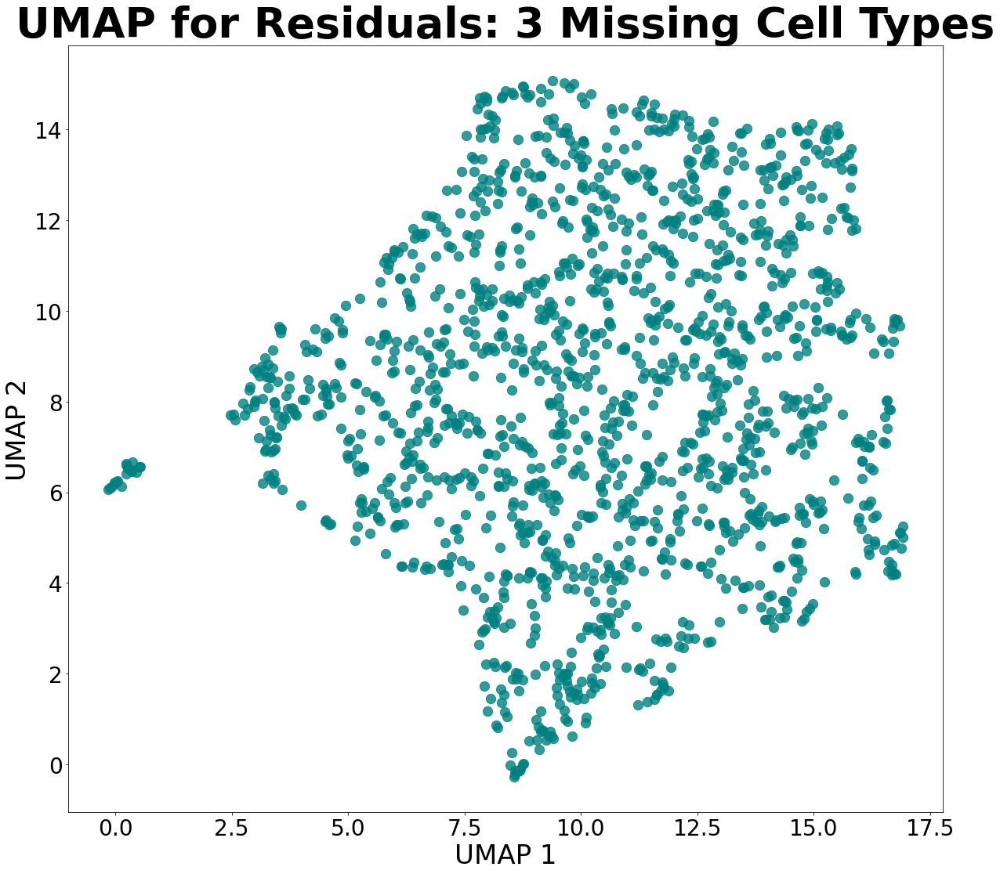

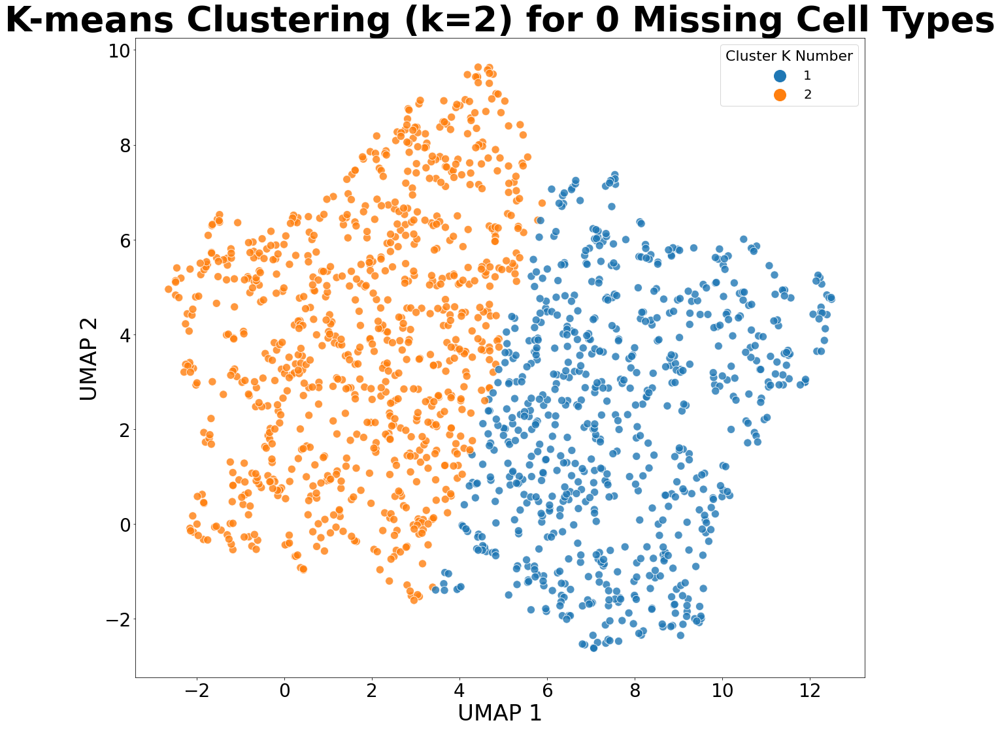

...

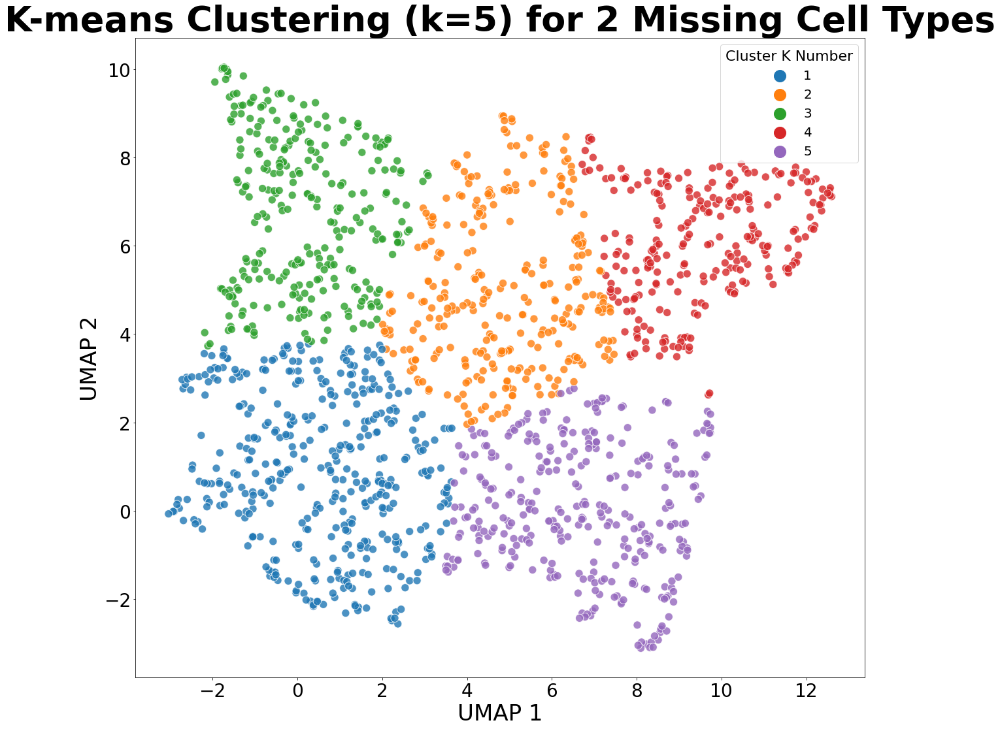

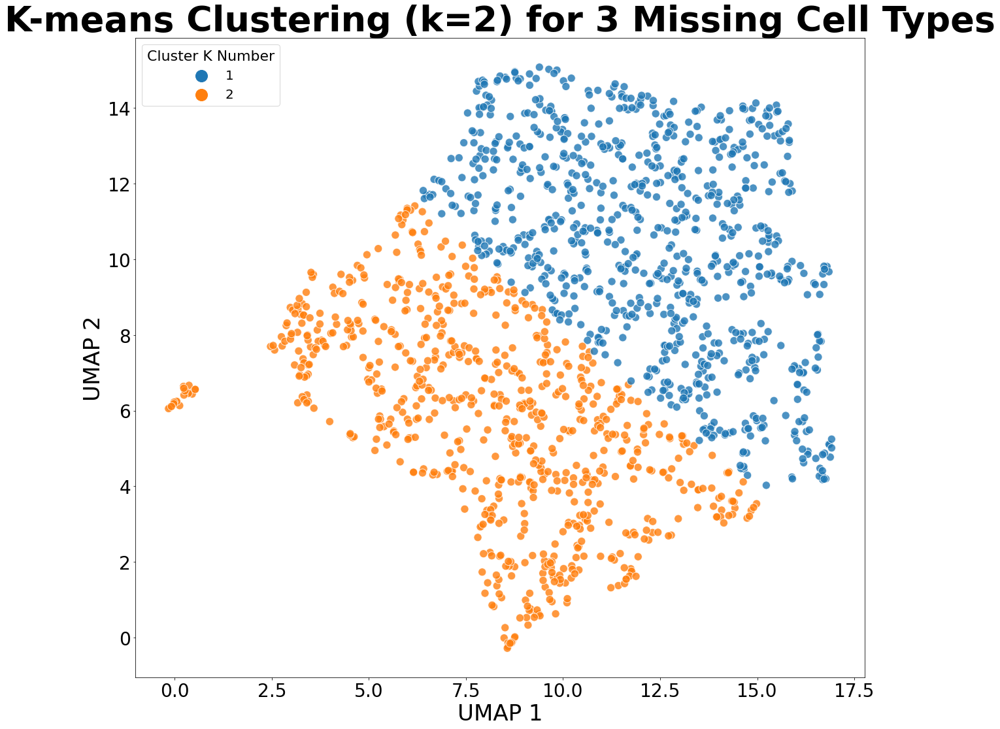

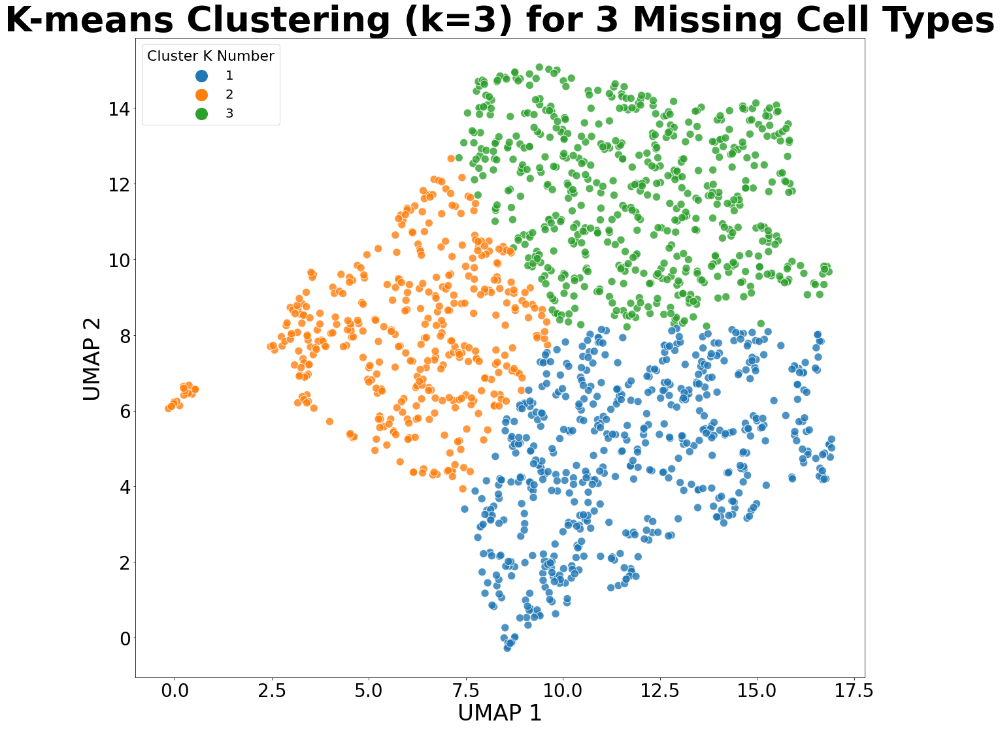

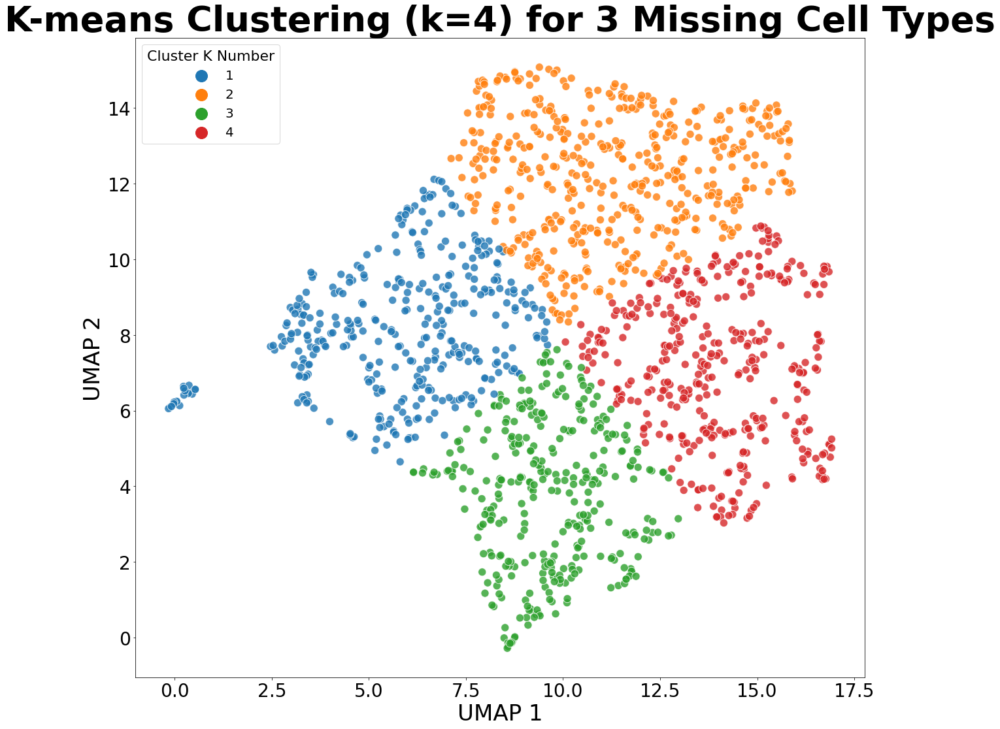

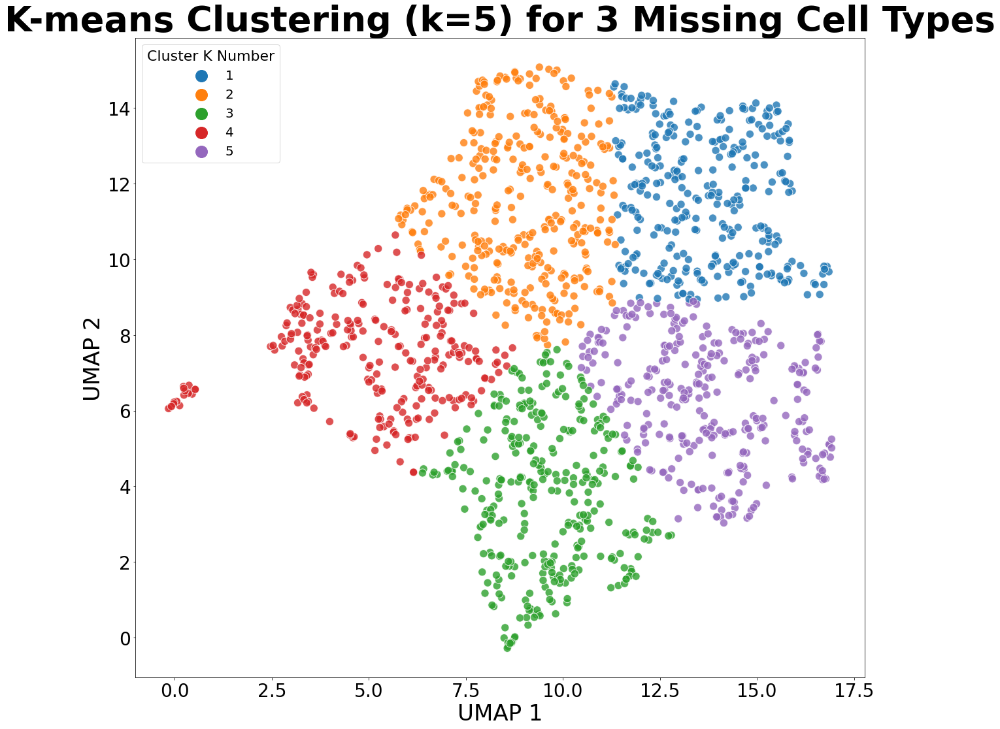

In [65]:
# Parameters
n_neighbors = 25
min_dist = 0.5
n_clusters_range = range(2, 6)  # Test k values from 2 to 5

# UMAP Embedding
umap_embeddings = {}
for num in num_cells_missing:
    df = residuals_train_1[num]  # Transpose for UMAP input
    reducer = umap.UMAP(n_neighbors=n_neighbors, min_dist=min_dist, random_state=42)
    embedding = reducer.fit_transform(df.values)
    umap_embeddings[num] = embedding
    # Plot UMAP
    plt.figure(figsize=(20, 18))
    plt.scatter(embedding[:, 0], embedding[:, 1], s=150, alpha=0.8, c="teal")
    plt.title(f'UMAP for Residuals: {num} Missing Cell Types', fontsize=54, fontweight='bold')
    plt.xlabel('UMAP 1', fontsize=34)
    plt.ylabel('UMAP 2', fontsize=34)
    plt.xticks(fontsize=28)
    plt.yticks(fontsize=28)
    plt.show()

# K-means Clustering on UMAP Embeddings for all k values
kmeans_results = {}
silhouette_scores = {}
for num, embedding in umap_embeddings.items():
    silhouette_scores[num] = []
    for k in n_clusters_range:
        kmeans = KMeans(n_clusters=k, random_state=42)
        labels = kmeans.fit_predict(embedding)
        score = silhouette_score(embedding, labels)
        silhouette_scores[num].append(score)

        # Plot clustering results for each k
        plt.figure(figsize=(20, 18))
        sns.scatterplot(
            x=embedding[:, 0],
            y=embedding[:, 1],
            hue=labels+1,
            palette='tab10',
            s=150,
            alpha=0.8
        )
        plt.title(f'K-means Clustering (k={k}) for {num} Missing Cell Types', fontsize=54, fontweight='bold')
        plt.xlabel('UMAP 1', fontsize=34)
        plt.ylabel('UMAP 2', fontsize=34)
        plt.xticks(fontsize=28)
        plt.yticks(fontsize=28)
        plt.legend(title='Cluster K Number', loc='best', fontsize=20, title_fontsize=22,  markerscale=3)
        plt.show()
    # Store best k and corresponding results
    best_k = n_clusters_range[silhouette_scores[num].index(max(silhouette_scores[num]))]
    kmeans_results[num] = {
        "best_k": best_k,
        "labels": labels,
        "score": max(silhouette_scores[num]),
    }

### Plot Silhouette Scores


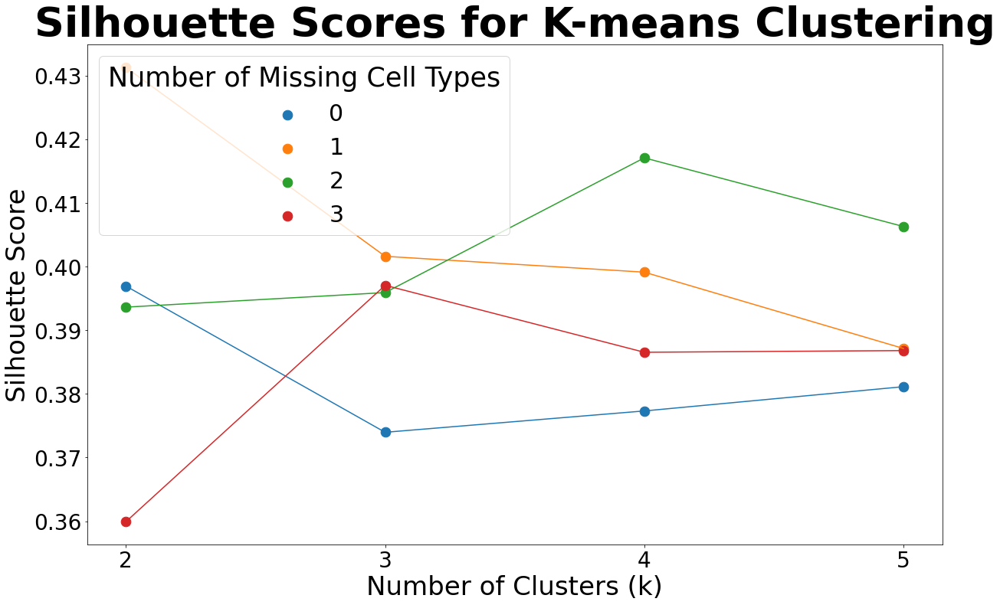

In [66]:
fig = plt.figure(figsize=(20, 12))
for num, scores in silhouette_scores.items():
    plt.plot(n_clusters_range, scores)
    plt.scatter(n_clusters_range, scores, label=f'{num}', marker='o', s=160)

plt.xlabel('Number of Clusters (k)', fontsize=34)
plt.ylabel('Silhouette Score', fontsize=34)
plt.title('Silhouette Scores for K-means Clustering', fontsize=54, fontweight='bold')
plt.xticks([2, 3, 4, 5], fontsize=28)
plt.yticks(fontsize=28)
plt.legend(title='Number of Missing Cell Types', loc='best', fontsize=30, title_fontsize=35)
plt.show()

## **PCA**

Calculating PCA for each Residual and Percent of Variance Explained

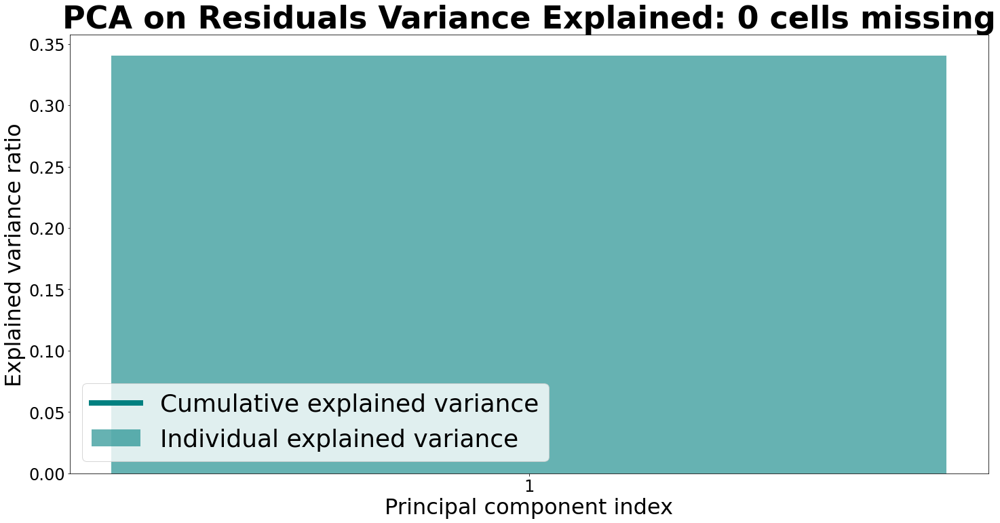

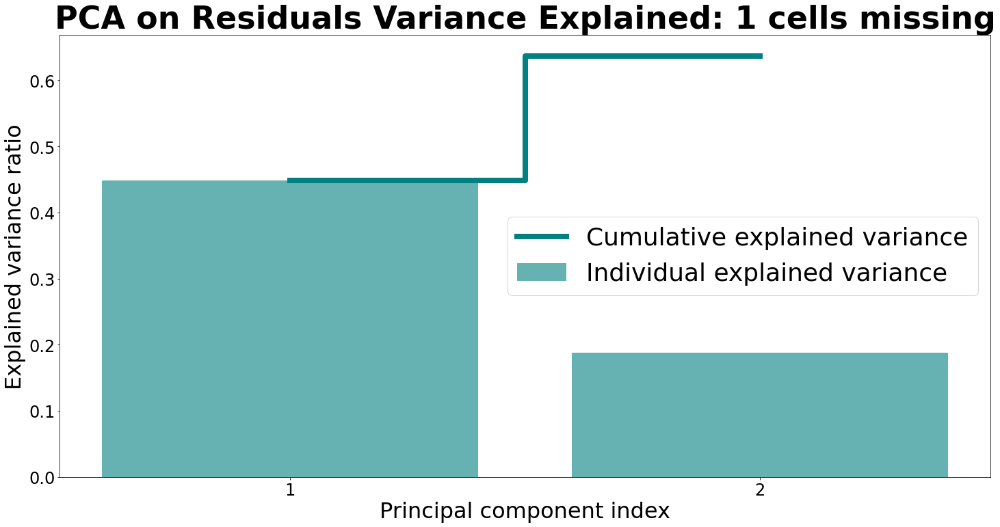

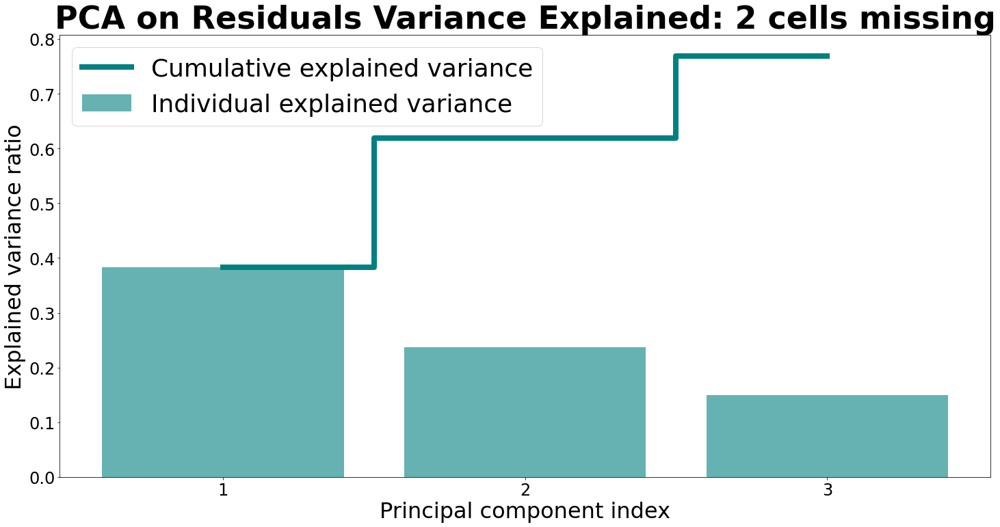

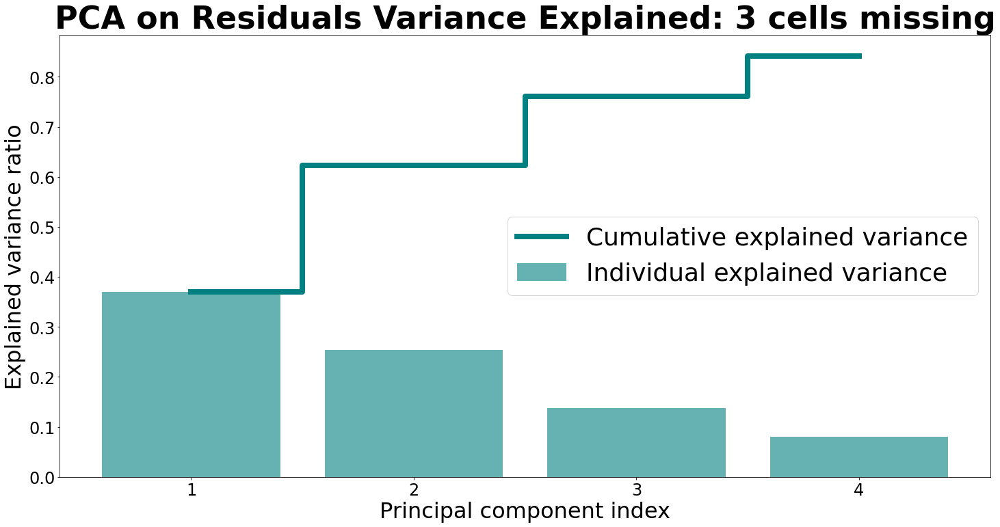

In [67]:
pca_res = dict()
for num in num_cells_missing:
    df = residuals_train_1[num]  # Transpose to get genes as rows
    fit = PCA(n_components=num + 1)
    pca_results = fit.fit_transform(df.values)

    exp_var_pca = fit.explained_variance_ratio_
    cum_sum_eigenvalues = np.cumsum(exp_var_pca)

    ## Plot variance explained
    plt.figure(figsize=(20, 10))
    # Adjust the range to start from 1
    pc_indices = range(1, len(exp_var_pca) + 1)
    
    plt.bar(pc_indices, exp_var_pca, alpha=0.6, align='center', label='Individual explained variance', width=0.8, color= "teal")
    plt.step(pc_indices, cum_sum_eigenvalues, where='mid', label='Cumulative explained variance', lw=8, c="teal")
    
    plt.ylabel('Explained variance ratio', fontsize=32)
    plt.xlabel('Principal component index', fontsize=32)
    plt.legend(loc='best', fontsize=36)
    plt.tight_layout()
    plt.xticks(pc_indices, fontsize=24)  # Ensure x-ticks match the PC indices
    plt.yticks(fontsize=24)
    plt.title(f"PCA on Residuals Variance Explained: {num} cells missing", fontsize=46, fontweight='bold')
    plt.show()
    pca_res[num] = pd.DataFrame(pca_results)


## NMF

Analyzing how close to negative the distributions of each residual are:

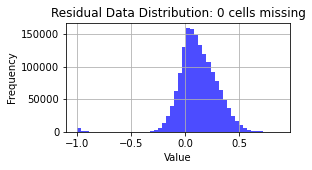

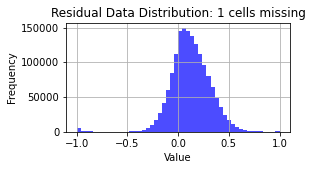

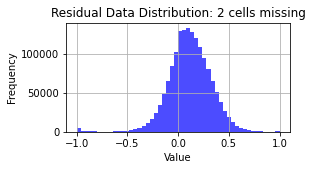

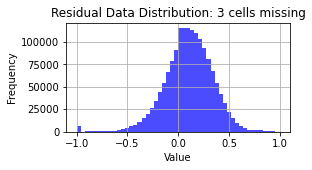

In [68]:
#distribution of residuals
for num in num_missing_cells:
    data = residuals_train_1[num].values
    plt.figure(figsize=(4, 2)) 
    plt.hist(data.flatten(), bins=50, color='blue', alpha=0.7)
    plt.title(f'Residual Data Distribution: {num} cells missing')
    plt.xlabel('Value')
    plt.ylabel('Frequency')
    plt.grid(True)
    plt.show()

Shifting distributions according to above plots, and calculating NMF:

1.0000000000000002


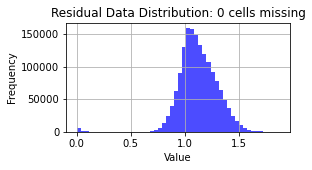

1.0000000000000002


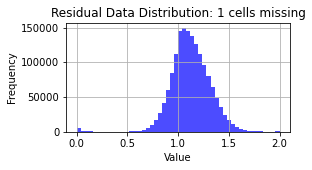

1.0000000000000002


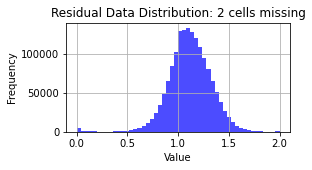

1.0000000000000002


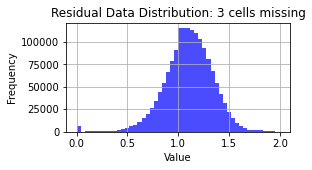

In [69]:
#shifting distribution of residuals_train_1 to do NMF
residuals_shift = residuals_train_1
for num in num_missing_cells:
    if nmf_cut == "minimum_value":
        #calculate value to shift distributions minimally:
        min_val = abs(np.min(np.min(residuals_train_1[num])))
        print(min_val)
        residuals_shift[num] = residuals_train_1[num] + min_val
    elif nmf_cut == "at_0":
        #cutting distribution at 0
        residuals_shift[num][residuals_shift[num].values <= 0] = 0
    data = residuals_shift[num].values
    plt.figure(figsize=(4, 2)) 
    plt.hist(data.flatten(), bins=50, color='blue', alpha=0.7)
    plt.title(f'Residual Data Distribution: {num} cells missing')
    plt.xlabel('Value')
    plt.ylabel('Frequency')
    plt.grid(True)
    plt.show()

### NMF Reconstruction errors:

In [70]:
def detect_elbow(reconstruction_errors):
    x = range(1, len(reconstruction_errors) + 1)
    knee_locator = KneeLocator(x, reconstruction_errors, curve="convex", direction="decreasing")
    return knee_locator.knee

In [71]:
# Function to compute reconstruction error for different NMF components
def nmf_signal_detection(matrix, max_components):
    reconstruction_errors = []

    for k in range(1, max_components + 1):
        nmf = NMF(n_components=k,  max_iter = 10000, init='nndsvd')
        W = nmf.fit_transform(matrix)
        H = nmf.components_
        
        # Reconstruction
        reconstructed = np.dot(W, H)
        reconstruction_error = np.linalg.norm(matrix - reconstructed, 'fro')
        
        reconstruction_errors.append(reconstruction_error)

    return reconstruction_errors

/Users/ivicha/anaconda3/envs/env_ml/lib/python3.9/site-packages/sklearn/decomposition/_nmf.py:1637: ConvergenceWarning: Maximum number of iterations 10000 reached. Increase it to improve convergence.
  warnings.warn(
/Users/ivicha/anaconda3/envs/env_ml/lib/python3.9/site-packages/sklearn/decomposition/_nmf.py:1637: ConvergenceWarning: Maximum number of iterations 10000 reached. Increase it to improve convergence.
  warnings.warn(
/Users/ivicha/anaconda3/envs/env_ml/lib/python3.9/site-packages/sklearn/decomposition/_nmf.py:1637: ConvergenceWarning: Maximum number of iterations 10000 reached. Increase it to improve convergence.
  warnings.warn(
/Users/ivicha/anaconda3/envs/env_ml/lib/python3.9/site-packages/sklearn/decomposition/_nmf.py:1637: ConvergenceWarning: Maximum number of iterations 10000 reached. Increase it to improve convergence.
  warnings.warn(


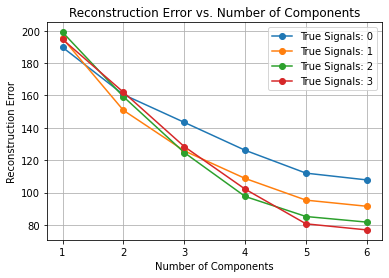

,True Signals,Detected Signals,Reconstruction Errors
0,0,2,"[189.73551724539593, 160.5358963336409, 143.37..."
1,1,2,"[195.364085813637, 150.81580668993212, 125.784..."
2,2,4,"[199.0369065249095, 159.22030864485058, 124.70..."
3,3,5,"[194.6490718383763, 162.00467335828063, 128.40..."


In [72]:
# Function to compute second derivative and detect signal number
def detect_signals_by_second_derivative(reconstruction_errors):
    # Compute first differences
    first_diff = np.diff(reconstruction_errors)
    # Compute second differences (curvature)
    second_diff = np.diff(first_diff)
    # Find the index of the largest second difference
    largest_second_diff_idx = np.argmax(second_diff)
    return largest_second_diff_idx + 2  # +2 to adjust for indexing of second differences

# Function to analyze signals using second derivative
def detect_signals_with_second_derivative(residuals, max_components):
    results = []

    for signals, matrix in residuals.items():
        reconstruction_errors = nmf_signal_detection(matrix, max_components)
        
        # Detect the number of signals using second derivative
        detected_signals = detect_signals_by_second_derivative(reconstruction_errors)
        
        results.append({
            'True Signals': signals,
            'Detected Signals': detected_signals,
            'Reconstruction Errors': reconstruction_errors,
        })
    
    return pd.DataFrame(results)

# Detect signals using scaled residual matrices
residuals_shift_scaled = {}
for num, matrix in residuals_shift.items():
    scaler = MinMaxScaler()
    scaled_matrix = scaler.fit_transform(matrix)
    residuals_shift_scaled[num] = pd.DataFrame(scaled_matrix)

# Detect signals with second derivative analysis
max_components = 6
results_df = detect_signals_with_second_derivative(residuals_shift_scaled, max_components=max_components)

# Plot reconstruction errors for each residual matrix
for signals, row in results_df.iterrows():
    plt.plot(range(1, max_components + 1), row['Reconstruction Errors'], marker='o', label=f"True Signals: {row['True Signals']}")
plt.title("Reconstruction Error vs. Number of Components")
plt.xlabel("Number of Components")
plt.ylabel("Reconstruction Error")
plt.legend()
plt.grid()
plt.show()
results_df

/Users/ivicha/anaconda3/envs/env_ml/lib/python3.9/site-packages/sklearn/decomposition/_nmf.py:1637: ConvergenceWarning: Maximum number of iterations 10000 reached. Increase it to improve convergence.
  warnings.warn(
/Users/ivicha/anaconda3/envs/env_ml/lib/python3.9/site-packages/sklearn/decomposition/_nmf.py:1637: ConvergenceWarning: Maximum number of iterations 10000 reached. Increase it to improve convergence.
  warnings.warn(
/Users/ivicha/anaconda3/envs/env_ml/lib/python3.9/site-packages/sklearn/decomposition/_nmf.py:1637: ConvergenceWarning: Maximum number of iterations 10000 reached. Increase it to improve convergence.
  warnings.warn(
/Users/ivicha/anaconda3/envs/env_ml/lib/python3.9/site-packages/sklearn/decomposition/_nmf.py:1637: ConvergenceWarning: Maximum number of iterations 10000 reached. Increase it to improve convergence.
  warnings.warn(
/Users/ivicha/anaconda3/envs/env_ml/lib/python3.9/site-packages/sklearn/decomposition/_nmf.py:1637: ConvergenceWarning: Maximum numb

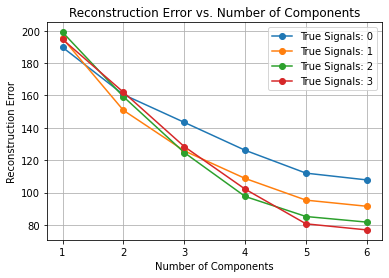

,True Signals,Detected Signals,Reconstruction Errors
0,0,2,"[128.7323119203331, 107.86272399007706, 95.577..."
1,1,2,"[156.83677004829755, 114.21511861893583, 96.09..."
2,2,4,"[173.07361641523977, 134.1443199170871, 104.00..."
3,3,5,"[180.816240551475, 150.92782895233393, 116.275..."


In [73]:
# Detect signals with second derivative analysis
max_components = 6
results_df_noscale = detect_signals_with_second_derivative(residuals_shift, max_components=max_components)

# Plot reconstruction errors for each residual matrix
for signals, row in results_df.iterrows():
    plt.plot(range(1, max_components + 1), row['Reconstruction Errors'], marker='o', label=f"True Signals: {row['True Signals']}")
plt.title("Reconstruction Error vs. Number of Components")
plt.xlabel("Number of Components")
plt.ylabel("Reconstruction Error")
plt.legend()
plt.grid()
plt.show()
results_df_noscale

/Users/ivicha/anaconda3/envs/env_ml/lib/python3.9/site-packages/sklearn/decomposition/_nmf.py:1637: ConvergenceWarning: Maximum number of iterations 10000 reached. Increase it to improve convergence.
  warnings.warn(
/Users/ivicha/anaconda3/envs/env_ml/lib/python3.9/site-packages/sklearn/decomposition/_nmf.py:1637: ConvergenceWarning: Maximum number of iterations 10000 reached. Increase it to improve convergence.
  warnings.warn(
/Users/ivicha/anaconda3/envs/env_ml/lib/python3.9/site-packages/sklearn/decomposition/_nmf.py:1637: ConvergenceWarning: Maximum number of iterations 10000 reached. Increase it to improve convergence.
  warnings.warn(
/Users/ivicha/anaconda3/envs/env_ml/lib/python3.9/site-packages/sklearn/decomposition/_nmf.py:1637: ConvergenceWarning: Maximum number of iterations 10000 reached. Increase it to improve convergence.
  warnings.warn(


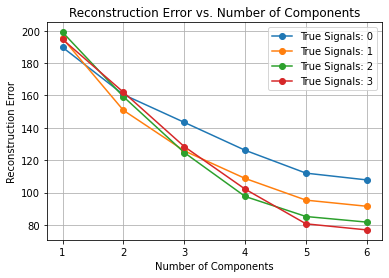

,True Signals,Detected Signals,Reconstruction Errors
0,0,5,"[189.73551724539593, 160.53589633364092, 143.3..."
1,1,5,"[195.36408581363696, 150.81580668993215, 125.7..."
2,2,5,"[199.0369065249095, 159.2203086448506, 124.702..."
3,3,5,"[194.64907183837627, 162.00467335828066, 128.4..."


In [74]:
# Function to detect signals using relative improvement threshold
def detect_signals_by_fit_quality(reconstruction_errors, threshold=0.05):
    # Compute relative improvement
    relative_improvement = [
        (reconstruction_errors[i - 1] - reconstruction_errors[i]) / reconstruction_errors[i - 1]
        for i in range(1, len(reconstruction_errors))
    ]
    
    # Find the first component where improvement is less than the threshold
    for i, improvement in enumerate(relative_improvement):
        if improvement < threshold:
            return i + 1  # +1 to adjust for indexing
    
    # If no threshold is reached, return max components
    return len(reconstruction_errors)

# Function to analyze signals using fit quality
def detect_signals_with_fit_quality(residuals, max_components, threshold=0.05):
    results = []

    for signals, matrix in residuals.items():
        reconstruction_errors = nmf_signal_detection(matrix, max_components)
        
        # Detect the number of signals using fit quality threshold
        detected_signals = detect_signals_by_fit_quality(reconstruction_errors, threshold=threshold)
        
        results.append({
            'True Signals': signals,
            'Detected Signals': detected_signals,
            'Reconstruction Errors': reconstruction_errors,
        })
    
    return pd.DataFrame(results)

# Detect signals using scaled residual matrices
residuals_shift_scaled = {}
for num, matrix in residuals_shift.items():
    scaler = MinMaxScaler()
    scaled_matrix = scaler.fit_transform(matrix)
    residuals_shift_scaled[num] = pd.DataFrame(scaled_matrix)

# Detect signals with fit quality threshold analysis
max_components = 6
results_df = detect_signals_with_fit_quality(residuals_shift_scaled, max_components=max_components, threshold=0.05)

# Plot reconstruction errors for each residual matrix
for signals, row in results_df.iterrows():
    plt.plot(range(1, max_components + 1), row['Reconstruction Errors'], marker='o', label=f"True Signals: {row['True Signals']}")
plt.title("Reconstruction Error vs. Number of Components")
plt.xlabel("Number of Components")
plt.ylabel("Reconstruction Error")
plt.legend()
plt.grid()
plt.show()
results_df

/Users/ivicha/anaconda3/envs/env_ml/lib/python3.9/site-packages/sklearn/decomposition/_nmf.py:1637: ConvergenceWarning: Maximum number of iterations 10000 reached. Increase it to improve convergence.
  warnings.warn(
/Users/ivicha/anaconda3/envs/env_ml/lib/python3.9/site-packages/sklearn/decomposition/_nmf.py:1637: ConvergenceWarning: Maximum number of iterations 10000 reached. Increase it to improve convergence.
  warnings.warn(
/Users/ivicha/anaconda3/envs/env_ml/lib/python3.9/site-packages/sklearn/decomposition/_nmf.py:1637: ConvergenceWarning: Maximum number of iterations 10000 reached. Increase it to improve convergence.
  warnings.warn(
/Users/ivicha/anaconda3/envs/env_ml/lib/python3.9/site-packages/sklearn/decomposition/_nmf.py:1637: ConvergenceWarning: Maximum number of iterations 10000 reached. Increase it to improve convergence.
  warnings.warn(
/Users/ivicha/anaconda3/envs/env_ml/lib/python3.9/site-packages/sklearn/decomposition/_nmf.py:1637: ConvergenceWarning: Maximum numb

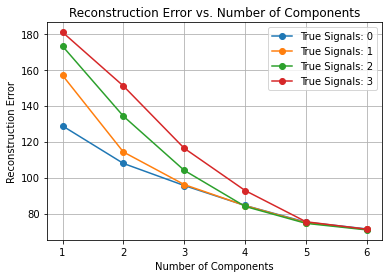

,True Signals,Detected Signals,Reconstruction Errors
0,0,6,"[128.7323119203331, 107.86272399007699, 95.577..."
1,1,5,"[156.83677004829752, 114.2151186189358, 96.098..."
2,2,5,"[173.07361641523977, 134.14431991708716, 104.0..."
3,3,6,"[180.81624055147498, 150.9278289523339, 116.27..."


In [75]:
# Detect signals with fit quality threshold analysis
max_components = 6
results_df = detect_signals_with_fit_quality(residuals_shift, max_components=max_components, threshold=0.05)

# Plot reconstruction errors for each residual matrix
for signals, row in results_df.iterrows():
    plt.plot(range(1, max_components + 1), row['Reconstruction Errors'], marker='o', label=f"True Signals: {row['True Signals']}")
plt.title("Reconstruction Error vs. Number of Components")
plt.xlabel("Number of Components")
plt.ylabel("Reconstruction Error")
plt.legend()
plt.grid()
plt.show()
results_df